# Praca inżynierska - metody manualne
W tej części zostanie zaimplementowany kod pozwalający rozwiązać problem układania puzzli. Plan działania algorytmu wygląda następująco:
1. Wykorzystanie biblioteki `piecemaker` do podzielenia obrazka na pojdeyncze kawałki puzzli
2. Wyznaczenie właściwości dotyczących pojedynczych kawałków (rodzaj puzzla, szerokości wypustki, maksymalna głębokość)
3. Stworzenie ramki danych, gdzie jeden wiersz oznacza jeden puzzel, a kolumny opisują jego właściwości
4. Na podstawie obliczonych metryk znajdowanie kolejnych pasujących elementów i w ten sposób ułożenie obrazka
5. Przygotowanie wizualizacji dla znalezionego rozwiązania
6. Obliczenie dokładności rozwiązania

In [1]:
from PIL import Image
from numpy import asarray
import os
import pandas as pd
import numpy as np
import math
from bs4 import BeautifulSoup
import re
import random
import copy

## Podział puzzli na rodzaje - ramka, narożnik, pozostałe puzzle

Rozwiązywanie problemu rozpoczynamy od wyznaczenia rodzaju każdego z puzzli. Wyróżniamy 3 rodzaje puzzli: 
* narożnik - cechuje się 2 pełnymi krawędziami
* ramka - cechuje się 1 pełną krawędź
* pozostałe puzzle

Pełną krawędź definiujemy jako skrajny wiersz (lub drugi skrajny), w którym co najmniej 50% wielkości wymiaru stanowią kolorowe pixele ułożone bez przerwy na pusty pixel.

In [2]:
#Funkcja do zamiany fragmentu puzzla na macierz pixeli
def getPixels(filename):  
    img = Image.open(filename, 'r')
    if(img.mode!='RGBA'):
        img=img.convert('RGBA')  #Wszystkie zdjęcia opisane w formacie RGBA
    w, h = img.size
    pix = list(img.getdata())
    return [pix[n:n+w] for n in range(0, w*h, w)]

In [3]:
#Funkcja sprawdzająca, czy dany kawałek należy do ramki
def is_puzzle_frame(image):
    
    df=pd.DataFrame(image).T
    image_transpose=df.values.tolist()       #Przydatne do badania pixeli w kolumnach

    first_row=image[0]
    second_row=image[1]   # Sprawdzamy też drugi wiersz/kolumnę ze względu na strukturę niektórych puzzli z ramki
    last_row=image[-1]
    second_to_last_row=image[-2]
    first_column=image_transpose[0]
    second_column=image_transpose[1]
    last_column=image_transpose[-1]
    second_to_last_column=image_transpose[-2]

    frame=[first_row,second_row, second_to_last_row, last_row, first_column, second_column, second_to_last_column, last_column]
    frame_elements=[]
    for f in frame:
        flag=False
        number_of_pixels_in_row=0  #Liczba kolorowych pixeli z rzędu w jednym z wierszy; elementy ramki cechują się dużą liczbą
        for i in range(len(f)):
            if f[i]!=(0,0,0,0) and flag==False:
                flag=True
                number_of_pixels_in_row+=1
                
            elif f[i]!=(0,0,0,0) and flag==True:
                number_of_pixels_in_row+=1
            elif f[i]==(0,0,0,0) and flag==True:
                flag=False
                frame_elements.append(number_of_pixels_in_row)
                break
        if flag == True:
            frame_elements.append(number_of_pixels_in_row)   

    return frame_elements     # Liczba kolorowych pixeli z rzędu dla 8 sprawdzanych wierszy/kolumn


In [4]:
def elements_of_frame_without_corners(elements,corners): #Funkcja do oddzielenia narożników od pozostałych elementów ramki

    for corner in corners:
        for i in range(len(elements)):
            if corner in elements[i]:
                elements[i].remove(corner)
                
    return elements

In [5]:
def puzzles_without_frame_elements(frame, corners, directory): #Funkcja do znalezienia elementów spoza ramki
    whole_frame=[]
    
    path = os.getcwd()+"\\"+directory
    path_el=os.listdir(path)            #Założenie, że katalog z puzzlami znajduje się w obecnym folderze
    puzzles_without_frame=[]
    for i in range(len(frame)):
        for j in range(len(frame[i])):
            whole_frame.append(frame[i][j])
    for i in range(len(corners)):
        whole_frame.append(corners[i])

    for i in range(len(path_el)):
        if(path_el[i] in whole_frame):
            continue
        else:
            puzzles_without_frame.append(path_el[i])

    return puzzles_without_frame

In [6]:
def find_frame_elements(directory):         #Wykorzystanie wszystkich poprzednich funkcji do podzielenia elemntów
    path = os.getcwd()+"\\"+directory
    path_el=os.listdir(path) 
    frame_elements = [ [] for i in range(4)]
    corners=[0,0,0,0]
    index=[-1,-1,-1,-1]
    for file in path_el:
        sum_of_pixels=[0,0,0,0]
        file_path=path + "\\" + file
        image=getPixels(file_path)
        height=len(image)
        width=len(image[0])
        pixels_in_row=is_puzzle_frame(image)
        ##  WAŻNE
        ### Od tego miejsca przyjmuję konwencję:
        #### index 0 - górna ramka obrazka lub górna część puzzla
        #### index 1 - dolna ramka obrazka lub dolna część puzzla
        #### index 2 - lewa ramka obrazka lub lewa część puzzla
        #### index 3 - prawa ramka obrazka lub prawa część puzzla
        ##
        if(pixels_in_row[0]>0.5*width or pixels_in_row[1]>0.5*width ):      #Założenie, że puzzle z ramki mają liczbę pixeli z rzędu>50% wymiaru
            frame_elements[0].append(file)                                  #Sprawdza się na razie zawsze
        elif(pixels_in_row[2]>0.5*width) or pixels_in_row[3]>0.5*width:
            frame_elements[1].append(file)
        elif(pixels_in_row[4]>0.5*height or pixels_in_row[5]>0.5*height):
            frame_elements[2].append(file)
        elif(pixels_in_row[6]>0.5*height or pixels_in_row[7]>0.5*height):
            frame_elements[3].append(file)

        sum_of_pixels[0]=max(pixels_in_row[0],pixels_in_row[1])+max(pixels_in_row[4],pixels_in_row[5])  #Szukam, które elementy są narożnikami
        sum_of_pixels[1]=max(pixels_in_row[0],pixels_in_row[1])+max(pixels_in_row[6],pixels_in_row[7])  #Liczy się suma pixeli na 2 sąsiadujących krawędziach
        sum_of_pixels[2]=max(pixels_in_row[2],pixels_in_row[3])+max(pixels_in_row[4],pixels_in_row[5])
        sum_of_pixels[3]=max(pixels_in_row[2],pixels_in_row[3])+max(pixels_in_row[6],pixels_in_row[7])

        for i in range(len(sum_of_pixels)):
            if sum_of_pixels[i]>corners[i]:
                corners[i]=sum_of_pixels[i]
                index[i]=file

    
    frame_elements=elements_of_frame_without_corners(frame_elements,index)
    non_frame_elements=puzzles_without_frame_elements(frame_elements,index,directory)

    return frame_elements, index,non_frame_elements   #Ostateczny podział na 3 tablice

## Przygotowanie ramki danych z podstawowymi własności puzzla
Podstawowe własności puzzli:
* nazwa pliku
* rodzaj - ramka, narożnik, pozostały
* rodzaj każdej wypustki - wklęsła, wypukła
* szerokość każdej wypustki
    * dla wklęsłej - szukamy do połowy wymiaru całego puzzla
    * dla wypukłej - bierzemy pierwsze `n` wierszy (wartość między 6 a 10; im więcej kawałków tym mniejsza wrtość)


### Wyznaczanie rodzaju wypustek

In [7]:
def create_matrix_of_bindings_type(directory): #funkcja tworząca przejściową macierz dotyczącą typów puzzli
    elements_of_frame,corners, non_frame_elements=find_frame_elements(directory)
    path = os.getcwd()+"\\"+directory
    path_el=os.listdir(path)
    matrix_of_bindings_type=[ [False]*5 for i in range(len(path_el))]
    matrix_of_bindings_type[0]=[corners[0],True,False,True,False]  #Pozycja True oznacza, że na tej pozycji puzzel jest ramką
    matrix_of_bindings_type[1]=[corners[1],True,False,False,True]
    matrix_of_bindings_type[2]=[corners[2],False,True,True,False]
    matrix_of_bindings_type[3]=[corners[3],False,True,False,True]
    
    k=4
    for i in range(len(elements_of_frame)):
        
        for element in elements_of_frame[i]:
            if(i==0):
                matrix_of_bindings_type[k]=[element,True,False,False,False]
            if(i==1):
                matrix_of_bindings_type[k]=[element,False,True,False,False]
            if(i==2):
                matrix_of_bindings_type[k]=[element,False,False,True,False]
            if(i==3):
                matrix_of_bindings_type[k]=[element,False,False,False,True]
            k=k+1
    for i in range(len(non_frame_elements)):
        matrix_of_bindings_type[k][0]=non_frame_elements[i]
        k=k+1

    return matrix_of_bindings_type
    

In [8]:
def get_kind_of_binding(image,side):    #Funkcja zwraca rodzaj danej wypustki
    if(side=="top"):
        x=range(len(image)//2)  #Sprawdzamy tylko do połowy wymiaru - wypustka nigdy nie będzie większa
    elif(side=="bottom"):
        x=range(len(image)-1,len(image)//2,-1)  
    elif(side=="left"):
        df=pd.DataFrame(image).T
        image=df.values.tolist()
        x=range(len(image)//2) 

    elif(side=="right"):
        df=pd.DataFrame(image).T
        image=df.values.tolist()
        x=range(len(image)-1,len(image)//2,-1) 

    kind=""

    for i in x:
        if(side=="top" or side=="left"):
            limit=i                     #limit oznacza numer sprawdzanego wiersza
        elif(side=="bottom" or side=="right"):
            limit=abs(i-len(image)+1)

        ## WYJAŚNIENIE
        ### Sprawdzamy co dzieje się przez 10% wymiaru (wartość empiryczna)
        ### Wypustkę wklęsłą ustalamy, gdy znajdziemy wiersz w którym mamy piksele kolorowe - pusty obszar - piksele kolorowe
        ### Wypustka wypukła charkateryzuje się tym, że po 10% wymiarów nie zajdzie warunek na wypustkę wklęsłą
        start=-1
        stop=-1
        number_of_rows=0
        for j in range(len(image[i])):
            if(image[i][j]!=(0,0,0,0) and start==-1):
                start=j
            elif(image[i][j]==(0,0,0,0) and start>-1):
                if number_of_rows==0:
                    stop=j
                number_of_rows+=1
            elif(image[i][j]!=(0,0,0,0) and stop>-1 ):
                number_of_rows+=1
                if (limit<len(image)//8):
                    kind = "wklesle"
                break

            if limit>len(image)//8 and kind!="wklesle" :
                kind="wypukle"

        if kind=="wklesle" or kind=="wypukle":
            break

    return kind             

In [9]:
def final_matrix_of_bindings_kind(matrix_of_bindings_type,directory): #Funkcja zwraca tablicę z rodzajami wypustek i wektor z rodzajem puzzla
    sides=['top','bottom','left','right']
    path = os.getcwd()+"\\"+directory
    matrix_of_bindings_type_strings=[[0]*len(matrix_of_bindings_type[0]) for i in range(len(matrix_of_bindings_type))]
    vector_of_type=[]
    for i in range(len(matrix_of_bindings_type_strings)):
        matrix_of_bindings_type_strings[i][0]=matrix_of_bindings_type[i][0] # kolumna 0 to nazwa pliku
        ramka=0
        for j in range(1,5):    #kolumny od 1 do 5 mówią o rodzaju wypustki
            
            if(matrix_of_bindings_type[i][j]==True):
                matrix_of_bindings_type_strings[i][j]='ramka'
                ramka+=1
            else:
                image=getPixels(path+"//"+matrix_of_bindings_type[i][0])
                matrix_of_bindings_type_strings[i][j]=get_kind_of_binding(image,sides[j-1])
        if(ramka==0):
            vector_of_type.append('non_frame')  # wektor z rodzajem puzzla

        elif(ramka==1):
            vector_of_type.append('frame')

        else:
            vector_of_type.append('corner')
    return matrix_of_bindings_type_strings ,vector_of_type

### Wyznaczanie szerokości wypustek puzzla

In [10]:
#Funkcja zwraca n pierwszych szerokości dla danej wypustki wypukłej
def metrics_for_wypukle(image,side,n):
    vector=[]

    if(side=="top"):
        x=range(n) 
    elif(side=="bottom"):
        x=range(len(image)-1,len(image)-(n+1),-1)  
    elif(side=="left"):
        df=pd.DataFrame(image).T
        image=df.values.tolist()
        x=range(n) 

    elif(side=="right"):
        df=pd.DataFrame(image).T
        image=df.values.tolist()
        x=range(len(image)-1,len(image)-(n+1),-1) 

    for i in x:
        start=-1
        stop=-1
        for j in range(len(image[i])):
            if image[i][j]!=(0,0,0,0) and start==-1:            #Sprawdzamy, gdzie zaczynają się pixele kolorowe
                start=j
            elif image[i][j]==(0,0,0,0) and start>-1:           #Oraz gdzie się kończą
                stop=j
                vector.append(stop-start)
                break
    return vector

In [11]:
#Funkcja zwraca wektor szerokości (do połowy wymiaru obrazka) dla danej wypustki wklęsłej
def metrics_for_wklesle(image,side):
    vector=[]

    if(side=="top"):
        x=range(len(image)//2)      #Liczę do połowy, bo wypustka nigdy nie będzie większa

    elif(side=="bottom"):
        x=range(len(image)-1,len(image)//2,-1)  

    elif(side=="left"):
        df=pd.DataFrame(image).T
        image=df.values.tolist()
        x=range(len(image)//2) 

    elif(side=="right"):
        df=pd.DataFrame(image).T
        image=df.values.tolist()
        x=range(len(image)-1,len(image)//2,-1) 

    for i in x:
        start=-1
        stop=-1
        flag=0
        middle_index=[]                                     #Liczba kolorowych pasów w jednym rzędzie
        possible_next=[]
        for j in range(len(image[i])):                      # Podobnie jak przy sprawdzaniu rodzaju wypustki
            if image[i][j]!=(0,0,0,0) and start==-1:        # Szukamy liczby pustych pixeli w rzędzie pomiędzy dwoma kolorowymi częściami 
                start=j
            elif image[i][j]==(0,0,0,0) and start>-1 and stop==-1:
                stop=j
            elif image[i][j]!=(0,0,0,0) and stop>-1 and flag==0:
                possible_next.append(j-stop)
                flag=+1

                half_of_size=len(image)/2
                middle_point=(j+stop)/2
                middle_index.append(abs(half_of_size-middle_point))
                
            elif flag !=0  and image[i][j]==(0,0,0,0):
                stop=j
                flag=0

        if(len(middle_index)==2):                           #Szukam pustego pasa, który znajduje się najbliżej środka wymiaru
            min_index=middle_index.index(min(middle_index))
            possible_next[0]=possible_next[min_index]


        if(len(possible_next)>0):
            vector.append(possible_next[0])
        else:
            vector.append(0)

    return vector

In [12]:
def metrics_of_bindings(final_matrix,directory,n):                  #Funkcja zwraca tablicę z policzonymi metrykami
    matrix_of_metrics=[ [False]*5 for i in range(len(final_matrix))]
    path = os.getcwd()+"\\"+directory
    sides=['top','bottom','left','right']
    for i in range(len(matrix_of_metrics)):
        for j in range(1,5):
            image=getPixels(path+"//"+final_matrix[i][0])
            matrix_of_metrics[i][0]=final_matrix[i][0]
            if(final_matrix[i][j]=="wypukle"):
                matrix_of_metrics[i][j]=metrics_for_wypukle(image,sides[j-1],n)
            elif(final_matrix[i][j]=="wklesle"):
                matrix_of_metrics[i][j]=metrics_for_wklesle(image,sides[j-1])
            else:
                matrix_of_metrics[i][j]=None

    return matrix_of_metrics

In [13]:
def transform_arrays_to_df(type_string,metrics,vector):     #Przekształcenie tabeli do ramki danych
    df_type_binding=pd.DataFrame(type_string)
    df_metrics_binding=pd.DataFrame(metrics)
    df_type_binding['type']=np.array(vector).T

    return df_type_binding.merge(df_metrics_binding,on=0)

## Układanie puzzli
W tej części szukamy puzzli, które do siebie pasują. Stosujemy następujące zasady:
* Wypustka wklęsła pasuje tylko do wypustki wypukłej
* Puzzle muszą pasować do siebie idealnie tzn. jeżeli wypustka wypukła zaczna się od 2 pikseli w rzędzie to odpowiadajaca wypustka wklęsła
musi kończyć się 2 pustymi pikselami
* Układanie zaczynamy od ramki 
    * górną i dolną ramkę układamy od lewej do prawej
    * lewą i prawą stronę ramki układamy od góry do dołu
* Nastepnie układamy wszystko w środku ramki - układamy zawsze od lewej do prawej, od górnej części obrazka do dolnej
* Jeżeli nie istnieją puzzle, które pasują do siebie idealnie, szukamy puzzli pasujących do siebie z największym prawdopodobieństwem. W tym celu wykorzystujemy funkcję, która 50% punktów przydziela za podobieństwo kolorów na końcu wypustki wypukłej i początku wklęsłej. Drugie 50% przydzielamy za szerokość skrajnego wiersza wypustki. 

### Funkcje wykorzystywane przy układaniu całego obrazka

In [14]:
def check_if_subset(vector1,vector2): #Funkcja sprawdzająca, czy metryka wypustki wklęsłej jest zgodna z metryką wypukłej
    k=0
    j=0
    for i in range(len(vector1)-1,-1,-1):
        if(vector1[i]==vector2[j]):
            k=k+1
            j=j+1

            if k==len(vector2):
                return True

            if j==len(vector2):
                break
        elif vector1[i]!=vector2[j] and k>0:
            if(vector1[i]==vector2[0]):
                k=1
                j=1
            else:
                k=0
                j=0
             
    return False

In [15]:
def get_indices_of_all_elements(directory):     #Funkcja zwraca tablicę z wszystkimi możliwymi id
    result=[]
    path = os.getcwd()+"\\"+directory
    path_el=os.listdir(path)
    rotate=[0,90,180,270]
    for element in path_el:
        for rotation in rotate:
            result.append(element+str(rotation))
    
    return result

In [16]:
def if_final_matrix_element2(vector,final_matrix):       #Sprawdzamy, czy element został już wcześniej wykorzystany

    result=list(map(lambda v: re.sub(r'\d+$', '', v) ,vector))
    matrix=list(map(lambda v: re.sub(r'\d+$', '', v) ,np.array(final_matrix).flatten()))


    return list(np.array(vector)[~np.array([item in matrix for item in result])])

In [17]:
#Funkcja wyznaczająca wartość dopasowania pomiędzy dwoma kolejnymi puzzlami
#Wybieramy puzzel z największą wartością funkcji dopasowania
#Zwracamy wartość dopasowania dla zadanych puzzli
def get_colors(next_puzzle,first_puzzle,binding_value,binding_next_value):
    color_value=binding_value[:-1]+'c'
    color_next_value=binding_next_value[:-1]+'c'
    distances=[]  
    length=[]  
    vector1=np.array(first_puzzle.iloc[0][color_value][0])
    for i in range(len(next_puzzle)):
        vector2=np.array(next_puzzle.iloc[i][color_next_value][0])

        length.append(len(vector2))
        if len(vector1)==len(vector2):                          #Podobieństwo kolorów obliczmy jako dystans w L2
            euclidean_distance=np.linalg.norm(vector1-vector2)
            distances.append(euclidean_distance)
        elif len(vector1)>len(vector2):                         #Dla wektorów różnej długości przycinamy dłuższy wektor kolorów
            euclidean_distance=np.linalg.norm(vector1[:len(vector2)]-vector2)
            distances.append(euclidean_distance)
        else:
            euclidean_distance=np.linalg.norm(vector1-vector2[:len(vector1)])
            distances.append(euclidean_distance)
    distances=np.array(distances)
    distances=(min(distances)+100)/(distances+100)              #Dodaję 100, żeby nie otrzymać 0 w mianowniku

    length=np.array(length)
    length=1/(abs(len(vector1)-length)+1)                       #Jeżeli dwa wektory mają identyczną długość, przyznajemy maksymalną liczbę punktów

    return 0.5*distances+0.5*length
    

In [18]:
def create_final_matrix(height,width,whole_df2):      #Tworzymy tablicę i wpisujemy do niej rozwiązaną ramkę

    final_matrix=[[0]*width for i in range(height)]
    final_matrix[0][0]=whole_df2[(whole_df2['1_x']=='ramka')&(whole_df2['3_x']=='ramka')&(whole_df2['rotation']==0)].iloc[0]['id'] #poszczególne narożniki
    final_matrix[0][-1]=whole_df2[(whole_df2['1_x']=='ramka')&(whole_df2['4_x']=='ramka')&(whole_df2['rotation']==0)].iloc[0]['id']
    final_matrix[-1][0]=whole_df2[(whole_df2['2_x']=='ramka')&(whole_df2['3_x']=='ramka')&(whole_df2['rotation']==0)].iloc[0]['id']
    final_matrix[-1][-1]=whole_df2[(whole_df2['2_x']=='ramka')&(whole_df2['4_x']=='ramka')&(whole_df2['rotation']==0)].iloc[0]['id']

    return final_matrix

### Funkcje wykorzystywane przy układaniu ramki
Ramkę układamy tylko od lewego narożnika. Skraca to czas układanie puzzli. Dodatkowo bierzemy tylko puzzle, które są oznaczone jako ramka. 

In [19]:
#Przykładowo wartość `top` oznacza sposób układania górnej ramki
def values_of_binding_columns(side):            #Wartości przy dopasowywaniu poszczególnych stron
    if(side=='top'):
        binding='4_x'
        binding_next='3_x'
        binding_value='4_y'
        binding_next_value='3_y'
        condition='1_x'

    elif(side=='bottom'):
        binding='4_x'
        binding_next='3_x'
        binding_value='4_y'
        binding_next_value='3_y'
        condition='2_x'

    elif(side=='left'):
        binding='2_x'
        binding_next='1_x'
        binding_value='2_y'
        binding_next_value='1_y'
        condition='3_x'
        
    elif(side=='right'):
        binding='2_x'
        binding_next='1_x'
        binding_value='2_y'
        binding_next_value='1_y'
        condition='4_x'

    return binding,binding_next,binding_value,binding_next_value,condition

In [20]:
#Funkcja wybiera wszystkie puzzle z ramki o odpowiednim kształcie
#Zwraca kolejny puzzel
def solved_puzzle_frame(whole_df,first_puzzle,side,directory,final_matrix):
    path = os.getcwd()+"\\"+directory
    path_el=os.listdir(path)
     
    binding,binding_next,binding_value,binding_next_value,condition=values_of_binding_columns(side)

    if (first_puzzle.iloc[0][binding]=='wklesle'):                  # Oddzielne warunki na układanie ramki
            next_possible_puzzle=whole_df[(whole_df[condition]=='ramka') & (whole_df[binding_next]=="wypukle")] 
    else:
        next_possible_puzzle=whole_df[(whole_df[condition]=='ramka') & (whole_df[binding_next]=="wklesle")]

    vector_of_possible_puzzles=if_final_matrix_element2(list(next_possible_puzzle['id']),final_matrix)
    possible_puzzles_without_removed=next_possible_puzzle[next_possible_puzzle['id'].isin(vector_of_possible_puzzles)]

    next_puzzle=matching_frame(possible_puzzles_without_removed,first_puzzle,binding_value,binding_next_value)
    
    rem_puzzles=[]
    if(len(vector_of_possible_puzzles)==0):
        rem_puzzles=if_final_matrix_element2(list(whole_df[whole_df['type']=='frame']['id']),final_matrix)
        print(rem_puzzles)
    return messages_frame(next_puzzle,possible_puzzles_without_removed,first_puzzle,whole_df,binding_value,binding_next_value,final_matrix,rem_puzzles)

In [21]:
#Funkcja zwraca listę z puzzlami z ramki o dokładnym dopasowaniu
def matching_frame(next_possible_puzzle,first_puzzle,binding_value,binding_next_value):
    next_puzzle=[]
    if(len(next_possible_puzzle)==0):
        return next_puzzle
    for i in range(len(next_possible_puzzle)):
        
        vector1=first_puzzle.iloc[0][binding_value]
        vector2=next_possible_puzzle.iloc[i][binding_next_value]

        if(vector1==None):

            return next_puzzle
        if(vector2==None):
            break


        if(len(vector1)<len(vector2)):
            vector1,vector2=vector2,vector1

        flag=check_if_subset(vector1,vector2)       #Sprawdzamy, czy szerokości wypustki wypukłej są podzbiorem kolejnych elementów dla wypustki wklęsłej
        
        if(flag==True):
            next_puzzle.append(next_possible_puzzle.iloc[i]['id'])

    return next_puzzle


In [22]:
#Wybieranie kolejnego puzzla do ramki - najpierw dokładne dopasowania potem dopasowania dla kształtów 
#Jeżeli nie ma takich puzzli wybieramy losowy z pozostałych
#2 zwracana wartość mówi, czy dokładne dopasowanie było tylko dla jednego elementu (1-tak, 0-nie)
def messages_frame(next_puzzle,next_possible_puzzle,first_puzzle,whole_df,binding_value,binding_next_value,final_matrix,remaining_puzzles):
    if(len(next_possible_puzzle)==0):

        return remaining_puzzles[0],-1
    if(len(next_puzzle)==1):
        return next_puzzle[0],1
    elif (len(next_puzzle)==0):

        similarity=get_colors(next_possible_puzzle,first_puzzle,binding_value,binding_next_value)
        index_max=np.argmax(similarity)
        return next_possible_puzzle.iloc[index_max]['id'],0
    else:

        next_puzzle_values=whole_df[whole_df['id'].isin(next_puzzle)]
        similarity=get_colors(next_puzzle_values,first_puzzle,binding_value,binding_next_value)
        index_max=np.argmax(similarity)
        return next_puzzle_values.iloc[index_max]['id'],0

In [23]:
def solving_puzzle_frame(whole_df,final_matrix,directory):     #Układamy całą ramkę
    height=len(final_matrix)
    width=len(final_matrix[0])

    sides=['top','bottom','left','right']
    limit=[width,width,height,height]
    corners=[final_matrix[0][0],final_matrix[-1][0],final_matrix[0][0],final_matrix[0][-1]] # Narożniki, od których będziemy układać

    number_of_accurate_matching=0
    number_of_iteration=0
    
    for i in range(len(sides)):
        flag=True
        first_puzzle=whole_df[(whole_df['id']==corners[i])]
        for j in range(limit[i]-1):
            #print(i,j)
            if(flag==False):
                if(i==0 or i==1):
                    if(i==0):
                        x=0
                    else:
                        x=-1
                    final_matrix[x][j]=rem_puzzles[ind]
                
                else:
                    if(i==2):
                        x=0
                    else:
                        x=-1
                    final_matrix[j][x]=rem_puzzles[ind]
                ind+=1
            else:
                if(i==0 or i==1):
                    if(i==0):
                        x=0
                    else:
                        x=-1
                    final_matrix[x][j]=first_puzzle.iloc[0]['id']
                else:
                    if(i==2):
                        x=0
                    else:
                        x=-1
                    final_matrix[j][x]=first_puzzle.iloc[0]['id']

            if(j<limit[i]-2):
                next_puzzle_element,is_accurate_matching=solved_puzzle_frame(whole_df,first_puzzle,sides[i],directory,final_matrix)
                number_of_accurate_matching+=is_accurate_matching
                if(is_accurate_matching==-1):
                    flag=False
                    rem_puzzles=if_final_matrix_element2(list(whole_df[whole_df['type']=='frame']['id']),final_matrix)
                    ind=0
                    continue
                number_of_iteration+=1

                first_puzzle=whole_df[(whole_df['id']==next_puzzle_element)]


    return final_matrix, round(number_of_accurate_matching/number_of_iteration,2)

### Funkcje wykorzystywane przy układaniu puzzli spoza ramki
Układając środek obrazka, mamy znacznie więcej możliwych dopasowań. Dlatego potrzebujemy dłuższych formuł. Dodatkowo mamy możliwość układania obrazka z każdego z 4 narożników.

In [24]:
# funkcja mówiąca, które krawędzie mamy łączyć ze sobą przy układaniu środka obrazka i rozpoczynania od różnych narożników
def values_of_binding_columns_non_frame(side):            #Wartości przy dopasowywaniu poszczególnych stron
    if(side=='left_top'):
        binding_first='1_x'
        binding_first_next='2_x'
        binding_second='4_x'
        binding_second_next='3_x'

        binding_first_value='1_y'
        binding_first_next_value='2_y'
        binding_second_value='4_y'
        binding_second_next_value='3_y'

    elif(side=='right_top'):
        binding_first='1_x'
        binding_first_next='2_x'
        binding_second='3_x'
        binding_second_next='4_x'

        binding_first_value='1_y'
        binding_first_next_value='2_y'
        binding_second_value='3_y'
        binding_second_next_value='4_y'

    elif(side=='left_bottom'):
        binding_first='2_x'
        binding_first_next='1_x'
        binding_second='4_x'
        binding_second_next='3_x'

        binding_first_value='2_y'
        binding_first_next_value='1_y'
        binding_second_value='4_y'
        binding_second_next_value='3_y'
        
    elif(side=='right_bottom'):
        binding_first='2_x'
        binding_first_next='1_x'
        binding_second='3_x'
        binding_second_next='4_x'

        binding_first_value='2_y'
        binding_first_next_value='1_y'
        binding_second_value='3_y'
        binding_second_next_value='4_y'

    return binding_first,binding_first_next,binding_second,binding_second_next,binding_first_value,binding_first_next_value,binding_second_value,binding_second_next_value

In [25]:
#Sposób układania puzzli dla poszczególnych narożników
def get_additional_puzzles(side,width,height):
    if(side=='left_top'):
        first_indices=-1,0
        second_indices=0,-1
        x=range(1,height-1)
        y=range(1,width-1)
    elif(side=='right_top'):
        first_indices=-1,0
        second_indices=0,1
        x=range(1,height-1)
        y=range(width-2,0,-1)
    elif(side=='left_bottom'):
        first_indices=1,0
        second_indices=0,-1
        x=range(height-2,0,-1)
        y=range(1,width-1)
    else:
        first_indices=1,0
        second_indices=0,1
        x=range(height-2,0,-1)
        y=range(width-2,0,-1)

    return first_indices,second_indices,x,y

In [26]:
#Funkcja wyszukuje kolejne możliwe puzzle do dopasowania oraz znajduje wszystkie puzzle niewykorzystane do tej pory
#Zwraca kolejny puzzel 
def solving_puzzle_non_frame(whole_df,first_puzzle,side,directory,final_matrix,additional_puzzles):    
    path = os.getcwd()+"\\"+directory
    path_el=os.listdir(path)

    
    second_puzzle=whole_df[(whole_df['id']==additional_puzzles[0])]
    binding_first,binding_first_next,binding_second,binding_second_next,binding_first_value,binding_first_next_value,binding_second_value,binding_second_next_value=values_of_binding_columns_non_frame(side)
   
    
    if (first_puzzle.iloc[0][binding_first_next]=='wklesle'):
        next_possible_puzzle=whole_df[(whole_df['type']=='non_frame') &(whole_df[binding_second_next]!=second_puzzle.iloc[0][binding_second])&(whole_df[binding_first]=="wypukle")]
    else:
        next_possible_puzzle=whole_df[(whole_df['type']=='non_frame') &(whole_df[binding_second_next]!=second_puzzle.iloc[0][binding_second])&(whole_df[binding_first]=="wklesle")]


    vector_of_possible_puzzles=if_final_matrix_element2(list(next_possible_puzzle['id']),final_matrix) 
    possible_puzzles_without_removed=next_possible_puzzle[next_possible_puzzle['id'].isin(vector_of_possible_puzzles)]     #Dostępne puzzle bez tych wykorzystanych już wcześniej
    next_puzzle=matching_frame(possible_puzzles_without_removed,first_puzzle,binding_first_next_value,binding_first_value)  #Puzzle z dokładnym dopasowaniem
 
    remaining_puzzles=[]

    if(len(vector_of_possible_puzzles)==0):
        remaining_puzzles=if_final_matrix_element2(get_indices_of_all_elements(directory),final_matrix)     #Wszystkie niewykorzystane puzzle
        return remaining_puzzles[0],0
    
    next_puzzle2=matching_non_frame(possible_puzzles_without_removed,second_puzzle,binding_second_value,binding_second_next_value)
    
    return messages_non_frame(next_puzzle,next_puzzle2,final_matrix,first_puzzle,second_puzzle,whole_df,possible_puzzles_without_removed,remaining_puzzles,
                                binding_first_value,binding_first_next_value,binding_second_value,binding_second_next_value)

In [27]:
#Szukamy dokładnego dopasowania wśród puzzli z pasującym kształtem wypustek
def matching_non_frame(next_possible_puzzle,second_puzzle,binding_value,binding_next_value):
    next_puzzle2=[]
    for i in range(len(next_possible_puzzle)):

        vector1=second_puzzle.iloc[0][binding_value]
        vector2=next_possible_puzzle.iloc[i][binding_next_value]
        

        if(len(vector1)<len(vector2)):
            vector1,vector2=vector2,vector1
        flag=check_if_subset(vector1,vector2)
        
        if(flag==True):
            next_puzzle2.append(next_possible_puzzle.iloc[i]['id'])
    return next_puzzle2

In [28]:
#Funkcja rozwiązująca problem wyboru kolejnego puzzle
#W sytuacji dokładnego dopasowania wybieramy puzzel z najwyższą średnią wartością podobieństwa do 2 poprzednich puzzli (first_puzzel, second_puzzel)
#Przy braku dokładnego dopasowania wybieramy puzzel z tych, które mają odpowiednie kształty wypustek
#Przy braku puzzli z odpowidnimi kształtami wypustek wybieramy puzzel z tych niewykorzystanych do tej pory
def messages_non_frame(next_puzzle,next_puzzle2,final_matrix,first_puzzle,second_puzzle,whole_df,next_possible_puzzle,remaining_puzzles,
                        binding_first_value,binding_first_next_value,binding_second_value,binding_second_next_value):

    common_part=np.intersect1d(next_puzzle, next_puzzle2)
    if(len(next_puzzle)>0 and len(next_puzzle2)>0):
        if(len(common_part)==1):
            
            return common_part[0],1

        elif(len(common_part)>1):
            #Similarity_top mówi o stopniu podobieństwa do puzzla, znajdującego się bezpośrednio powyżej
            #Analogicznie similarity_left
            #Wyznaczamy średnią wartość i wybieramy element z największą wartością funkcji dopasowania
            similarity_top=get_colors(next_possible_puzzle[next_possible_puzzle['id'].isin(common_part)],first_puzzle,binding_first_next_value,binding_first_value)
            similarity_left=get_colors(next_possible_puzzle[next_possible_puzzle['id'].isin(common_part)],second_puzzle,binding_second_value,binding_second_next_value)
            similarity=(similarity_top+similarity_left)/2
            
            index_max=np.argmax(similarity)
            
            return common_part[index_max],0
        else:

            next_puzzle_all=next_puzzle+next_puzzle2
            similarity_top=get_colors(next_possible_puzzle[next_possible_puzzle['id'].isin(next_puzzle_all)],first_puzzle,binding_first_next_value,binding_first_value)

            similarity_left=get_colors(next_possible_puzzle[next_possible_puzzle['id'].isin(next_puzzle_all)],second_puzzle,binding_second_value,binding_second_next_value)
            similarity=(similarity_top+similarity_left)/2

            index_max=np.argmax(similarity)
            returned_puzzle=next_possible_puzzle[next_possible_puzzle['id'].isin(next_puzzle_all)]
            
            return returned_puzzle.iloc[index_max]['id'],0
    
    elif(len(next_possible_puzzle)==0):     #Brak puzzli o odpowiednim kształcie wypustek
        values=whole_df[whole_df['id'].isin(remaining_puzzles)]
        similarity_top=get_colors(values,first_puzzle,binding_first_next_value,binding_first_value)

        similarity_left=get_colors(values,second_puzzle,binding_second_value,binding_second_next_value)
        similarity=(similarity_top+similarity_left)/2
        index_max=np.argmax(similarity)
        
        return values.iloc[index_max]['id'],0

    elif(len(next_puzzle2)==0 and len(next_puzzle)==0 ):    #Brak dokładnego dopasowania dla żadnego z dwóch poprzednich puzzli

        similarity_top=get_colors(next_possible_puzzle,first_puzzle,binding_first_next_value,binding_first_value)

        similarity_left=get_colors(next_possible_puzzle,second_puzzle,binding_second_value,binding_second_next_value)
        similarity=(similarity_top+similarity_left)/2
        index_max=np.argmax(similarity)
        
        return next_possible_puzzle.iloc[index_max]['id'],0

    elif(len(next_puzzle)==0):      
        
        similarity_left=get_colors(next_possible_puzzle[next_possible_puzzle['id'].isin(next_puzzle2)],second_puzzle,binding_second_value,binding_second_next_value)

        index_max=np.argmax(similarity_left)
        
        return next_puzzle2[index_max],0

    elif(len(next_puzzle2)==0):
        
        similarity_top=get_colors(next_possible_puzzle[next_possible_puzzle['id'].isin(next_puzzle)],first_puzzle,binding_first_next_value,binding_first_value)
        index_max=np.argmax(similarity_top)
       
        return next_puzzle[index_max],0

In [29]:
def solving_whole_image(whole_df,directory,final_matrix,side):      #Tablica z końcowymi pozycjami puzzli
    width=len(final_matrix[0])
    height=len(final_matrix)
    
    number_of_accurate_matching=0
    number_of_iteration=0
    sides=['left_top','right_top','left_bottom','right_bottom']

    final_matrices=[]
    accuracy=[]
    

    first_indices,second_indices,x,y=get_additional_puzzles(side,width,height)
    for i in x:
        for j in y:
            additional_puzzles=[final_matrix[i+second_indices[0]][j+second_indices[1]]]
            first_puzzle=final_matrix[i+first_indices[0]][j+first_indices[1]]

            next_puzzle,is_accurate_matching=solving_puzzle_non_frame(whole_df,whole_df[whole_df['id']==first_puzzle],side,directory,final_matrix,additional_puzzles)
            number_of_accurate_matching+=is_accurate_matching
            number_of_iteration+=1

            final_matrix[i][j]=next_puzzle
    acc_nf=round(number_of_accurate_matching/number_of_iteration,2)
    
    
    return final_matrix,acc_nf

## Metryki związane z maksymalną głębokością wypustki i jej kolorem

### Maksymalna głębokość wypustki
Kolejną metryką jest maksymalna głębokość wypustki. Jest to metryka przydatna do obliczania pozycji danego puzzla na wizualizacji. Jako pozycję puzzla rozumiem odległość w pionie i poziomie od lewego górnego narożnika.

Maksymalną głębokość obliczamy tylko dla wypustek wklęsłych. Dla wypustek wypukłych jest równa 0. Dla wypustki wklęsłej szukamy maksymalnej głębokości w ten sposób:
* Odcinamy po 35% z lewej i prawej strony. Maksymalna głębokość zawsze znajduje się w okolicach połowy wymiaru.
* Dla każdej kolumny patrzymy ile jest pustych pikseli z rzędu, patrząc od zerowego wiersza
* Zapisujemy maksymalną głębokość oraz pozycję pierwszego niepustego piksela w tej kolumnie (przydatne do wyznaczania metryki związanej z kolorem)

In [30]:
# Funkcja zwraca maksymalną głębokość danej wypustki oraz współrzędne, gdzie znajduje się to miejsce
def metrics_binding_max_depth(image,whole_df2,directory):

    data=getPixels(directory+'//'+image)

    start=math.floor(0.35*len(data[0]))     #Odcinamy po 35 % z lewej i prawej strony obrazka; max głębokość musi być w pobliżu środka wymiaru
    stop=math.floor(0.65*len(data[0]))
    width=range(start,stop)

    start2=math.floor(0.35*len(data))
    stop2=math.floor(0.65*len(data))
    width2=range(start2,stop2)


    puzzle=whole_df2[whole_df2[0]==image]
    columns=['1_x','2_x','3_x','4_x']
    result=[0]*4
    result_ind=[0]*4
    it=0
    for column in columns:

        if(puzzle.iloc[0][column]=="wklesle") :         #Głębokość tylko dla wklęsłych, dla wypukłych 0

            if(column=='1_x'):                          
                x=width
                y=range(len(data)//2)

            if(column=='2_x'):
                x=width
                y=range(len(data)-1,len(data)//2,-1)

            if(column=='3_x'):
                x=width2
                y=range(len(data[0])//2)

            if(column=='4_x'):
                x=width2
                y=range(len(data[0])-1,len(data[0])//2,-1)
        else:
            it+=1
            continue
        vector=[]
        indices=[]
        for i in x:
            k=0
            for j in y:
                if(column=='1_x' or column=='2_x'):
                    if(data[j][i]==(0,0,0,0)):
                        k=k+1
                    elif(data[j][i]!=(0,0,0,0) and k>0):
                       
                        break

                else:
                    if(data[i][j]==(0,0,0,0)):
                        k=k+1
                    elif(data[i][j]!=(0,0,0,0) and k>0):
                        
                        break
                    
            if(column=='1_x' or column=='2_x'):
                indices.append([j,i])
            else:
                indices.append([i,j])
            vector.append(k)
        result[it]=max(vector)
        index_of_max_depth=vector.index(max(vector))
        result_ind[it]=indices[index_of_max_depth]
        
        it=it+1

    return result, result_ind


### Kolor wypustki puzzla
Jako kolor wypustki puzzla należy rozumieć wektor kolorów pikseli:
* dla wypustki wklęsłej - korzystamy z indeksu z funkcji o maksymalnej głębokości. Sczytujemy kolory dla pikseli, pod którymi bezpośrednio znajduje się pusty piksel. 
* dla wypustki wypukłej - sczytujemy kolory z pierwszego skrajnego wiersza, czyli początku wypustki.

Jest to metryka, która przyda się przy wyznaczaniu współczynnika dopasowania puzzli.

In [31]:
#Funkcja zwraca kolory wypustek dla wszystkich puzzli
def colors_of_pixels(directory,whole_df2):
    path = os.getcwd()+"\\"+directory
    path_el=os.listdir(path)
    result=[]
    result2=[]
    for file in path_el:
        data=getPixels(path+'//'+file)
        max_depth,index_of_max_depth=metrics_binding_max_depth(file,whole_df2,directory)
        colors=[]
        for j in range(4):
            current_img=whole_df2[whole_df2[0]==file]
            if(current_img.iloc[0][f'{j+1}_x']=='ramka'):   #Dla ramki nie liczymy kolorów
                colors.append([None])
                continue
            if(j<2):    #Góra, dół
                colors.append([top_bottom_colors(max_depth,index_of_max_depth,data,j)])     

            else:       #Lewo, prawo
                colors.append([left_right_colors(max_depth,index_of_max_depth,data,j)])

        result.append(colors)
        result2.append([*max_depth])
    return colors_arrays_to_one_df(result,result2,path_el,whole_df2)

In [32]:
#Całość zapisujemy do ramki danch i łączymy to z poprzednią ramką dotyczącą metryk
def colors_arrays_to_one_df(result,result2,path_el,whole_df2):
    result=pd.DataFrame(result)
    result2=pd.DataFrame(result2)
    path_el=pd.DataFrame(path_el)
    result=pd.concat([path_el,result,result2],axis=1)
    result.columns=[0,'1_c','2_c','3_c','4_c','1_d','2_d','3_d','4_d']
    result=whole_df2.merge(result,right_on=0,left_on=0)
    result['rotation']=0
    return result

In [33]:
#Funkcja zwraca kolor wypustki wypukłej
def colors_wypukle(data,i):
    colors=[]
    if(i==0 or i==1):
        for j in range(len(data[0])):
            if(i==0):
                x=0
            else:
                x=-1
            if data[x][j]!=(0,0,0,0):
                colors.append(data[x][j])
    else:
        for j in range(len(data)):
            if(i==2):
                y=0
            else:
                y=-1
            if data[j][y]!=(0,0,0,0):
                colors.append(data[j][y])

    return colors

In [34]:
# Funkcja znajdująca kolor wypustki wklęsłej znajdującej się na górze lub dole puzzla.
def top_bottom_colors(max_depth,index_of_max_depth,data,i):
    colors=[]

    if max_depth[i]!=0:

        x=index_of_max_depth[i][0]
        
        y=index_of_max_depth[i][1]
        y_2=index_of_max_depth[i][1]-1
        flag_y=True
        flag_y_2=True

        while(flag_y or flag_y_2):
            if(i==1 and data[x+1][y]==(0,0,0,0) and data[x][y]!=(0,0,0,0)):
                colors.append(data[x][y])
                y=y+1

            elif(i==0 and data[x-1][y]==(0,0,0,0) and data[x][y]!=(0,0,0,0)):
                colors.append(data[x][y])
                y=y+1

            else:
                flag_y=False
            
            if(i==1 and  data[x][y_2]!=(0,0,0,0) and data[x-1][y_2]==(0,0,0,0)):
                colors.insert(0,data[x][y_2])
                y_2=y_2-1

            if(i==0 and data[x][y_2]!=(0,0,0,0) and data[x-1][y_2]==(0,0,0,0)):
                colors.insert(0,data[x][y_2])
                y_2=y_2-1

            else:
                flag_y_2=False
    
    
    else:
        return colors_wypukle(data,i)
    return colors

In [35]:
# Funkcja znajdująca kolor wypustki wklęsłej znajdującej się z lewej lub prawej strony puzzla.
def left_right_colors(max_depth,index_of_max_depth,data,i):
    colors=[]

    if max_depth[i]!=0:

        x=index_of_max_depth[i][0]
        
        y=index_of_max_depth[i][1]
        x_2=index_of_max_depth[i][0]-1
        flag_x=True
        flag_x_2=True

        while(flag_x or flag_x_2):
            if(i==3 and data[x][y+1]==(0,0,0,0) and data[x][y]!=(0,0,0,0)):
                colors.append(data[x][y])
                x=x+1

            elif(i==2 and data[x][y-1]==(0,0,0,0) and data[x][y]!=(0,0,0,0)):
                colors.append(data[x][y])
                x=x+1

            else:
                flag_x=False
            
            if(i==3 and data[x_2][y]!=(0,0,0,0) and data[x_2][y+1]==(0,0,0,0)):
                colors.insert(0,data[x_2][y])
                x_2=x_2-1

            elif(i==2 and data[x_2][y]!=(0,0,0,0) and data[x_2][y-1]==(0,0,0,0)):
                colors.insert(0,data[x_2][y])
                x_2=x_2-1

            else:
                flag_x_2=False
    
    else:
        return colors_wypukle(data,i)

    return colors

## Obroty puzzli
Każdy puzzel możemy obrócić o wielokrotność 90 stopni. Utrudnia to znalezienie prawidłowego puzzla do dopasowania. Jako uproszczenie zakłądamy, że narożników nie można obracać. 

In [36]:
#Funkcja rozszerzająca ramkę danych o puzzle, które mogłyby powstać w wyniku obrotu
#Dodatkowo tworzymy kolumnę `id`, która identyfikuje obserwację oraz `rotation` oznaczającą kąt o jaki puzzel został obrócony
def create_whole_df_with_rotations(whole_df2):
    data_frames=[]
    chain_of_changes=[1,4,2,3]
    columns_to_change_value=['1_x','2_x','3_x','4_x','1_y','2_y','3_y',
        '4_y','1_c','2_c','3_c','4_c','1_d','2_d','3_d','4_d']
    for i in range(1,4):
        df = pd.DataFrame(columns=whole_df2.columns)
        for column in columns_to_change_value:
            number=int(column[0])
            position_in_chain=chain_of_changes.index(number)
            next_position=(position_in_chain+i)%4
            name=str(chain_of_changes[next_position])+column[1:]
            df[name]=whole_df2[column]
        df[0]=whole_df2[0]
        df['type']=whole_df2['type']
        df['rotation']=-90*i
        df['id']=df[0]+str(90*i)
        data_frames.append(df)
    whole_df2['id']=whole_df2[0]+'0'
    return pd.concat([whole_df2,data_frames[0],data_frames[1],data_frames[2]])

In [37]:
#Wybieramy losową liczbę puzzli do obrócenia o losową wielokrotność 90 stopni
def rotate_random_number_of_elements(whole_df2,directory):
    subset=whole_df2[whole_df2['type']!='corner']
    sequence = [i for i in range(len(subset))]
    number_of_rotate_elements=random.randint(1,len(subset))
    subset_id=random.sample(sequence,number_of_rotate_elements)
    for i in subset_id:
        file_name=subset.iloc[i][0]
        im = Image.open(f"{directory}/{file_name}")
        im.rotate(-90*random.randint(1,3), expand=True).save(f"{directory}/{file_name}")

## Wizualizacja
Końcowym etapem jest prezentacja wyników w postaci wizualizacji. Po wyznaczeniu w jakiej kolejności należy układać puzzle i o ile należy obrócić dany puzzel, możemy spróbować odtworzyć wejściowy obrazek. Głównym zadaniem przy wizualizacji jest znalezienie pozycji puzzla (odległość w poziomie i pionie od lewgo górnego narożnika).

In [38]:
def dimensions(result,directory):       #Zwraca maksymalne wymiary ostatecznego obrazka - zawsze będą mniejsze
    whole_width=0
    whole_height=0
    for i in range(len(result[0])):
        image=Image.open(directory+"//"+re.sub(r'\d+$', '',str(result[0][i])), 'r')
        whole_width+=image.width

    for i in range(len(result)):
        image=Image.open(directory+"//"+re.sub(r'\d+$', '',str(result[i][0])), 'r')
        whole_height+=image.height

    return whole_height, whole_width

In [39]:
def matrix_of_translation(result,whole_df2,directory):  #Zwraca pozycję, na których powinny się znaleźć poszczególne puzzle w wizualizacji
    matrix=[[0]*len(result[0]) for i in range(len(result))]
    matrix[0][0]=[result[0][0],0,0]

    for i in range(1,len(result[0])):                       #Najpierw znajdujemy pozycje górnej ramki
        tmp_puzzle=whole_df2[whole_df2['id']==result[0][i]]
        prev_puzzle=whole_df2[whole_df2['id']==result[0][i-1]]
        image=Image.open(directory+"//"+re.sub(r'\d+$', '',str(result[0][i-1])), 'r')    
        image = image.rotate(prev_puzzle.iloc[0]['rotation'], expand=True)          #Obrót puzzla zgodnie z kolumną `rotation`
        if(prev_puzzle.iloc[0]['4_x']=='wklesle'):
            translation=prev_puzzle.iloc[0]['4_d']
        else:
            translation=tmp_puzzle.iloc[0]['3_d']
        x_trans=matrix[0][i-1][1]+image.width-translation+2                     #Wyliczam pozycję od lewej; od góry równa 0
        matrix[0][i]=[result[0][i],x_trans,0]

  
    for i in range(1,len(result)):                      #Potem znajdujemy pozycje kawałków z lewej strony ramki
        tmp_puzzle=whole_df2[whole_df2['id']==result[i][0]]
        prev_puzzle=whole_df2[whole_df2['id']==result[i-1][0]]
        image=Image.open(directory+"//"+re.sub(r'\d+$', '',str(result[i-1][0])), 'r')
        image = image.rotate(prev_puzzle.iloc[0]['rotation'], expand=True)
        if(prev_puzzle.iloc[0]['2_x']=='wklesle'):
                    translation=prev_puzzle.iloc[0]['2_d']
        else:
            translation=tmp_puzzle.iloc[0]['1_d']

        y_trans=matrix[i-1][0][2]+image.height-translation+2
        matrix[i][0]=[result[i][0],0,y_trans]


    for i in range(1,len(result)):                  #Pozycje wszystkich pozostałych puzzli
        for j in range(1,len(result[0])):
            if(result[i][j]==0):
                return matrix
            tmp_puzzle=whole_df2[whole_df2['id']==result[i][j]]
            left_puzzle=whole_df2[whole_df2['id']==result[i][j-1]]
            top_puzzle=whole_df2[whole_df2['id']==result[i-1][j]]

            image_left=Image.open(directory+"//"+re.sub(r'\d+$', '',str(result[i][j-1])), 'r')
            
            image_left = image_left.rotate(left_puzzle.iloc[0]['rotation'], expand=True)
            
            image_top=Image.open(directory+"//"+re.sub(r'\d+$', '',str(result[i-1][j])), 'r')
            image_top = image_top.rotate(top_puzzle.iloc[0]['rotation'], expand=True)
            
            if(left_puzzle.iloc[0]['4_x']=='wklesle'):
                translation_x=left_puzzle.iloc[0]['4_d']
            else:
                translation_x=tmp_puzzle.iloc[0]['3_d']

            if(top_puzzle.iloc[0]['2_x']=='wklesle'):
                translation_y=top_puzzle.iloc[0]['2_d']
            else:
                translation_y=tmp_puzzle.iloc[0]['1_d']

            x_trans=matrix[i][j-1][1]+image_left.width-translation_x+2        #+2, żeby było widać łączenia między puzzlami
            y_trans=matrix[i-1][j][2]+image_top.height-translation_y+2
            matrix[i][j]=[result[i][j],x_trans,y_trans]

    return matrix

In [40]:
def visualization(result,matrix,whole_df2,directory):       # Ostateczna wizualizacja

    dim=dimensions(result,directory)
    text_img = Image.new('RGBA', (dim[1],dim[0]), (0, 0, 0, 0))  

    filename=directory+'//'+re.sub(r'\d+$', '',str(result[0][0]))
    image = Image.open(filename, 'r')
    text_img.paste(image, (matrix[0][0][1],matrix[0][0][2]))

    for i in range(len(result[0])):                 #Układamy pierwszy wiersz od góry
        filename=directory+'//'+re.sub(r'\d+$', '',str(result[0][i]))
        image = Image.open(filename, 'r').convert('RGBA')
        image = image.rotate(whole_df2[whole_df2['id']==result[0][i]].iloc[0]['rotation'], expand=True)
        text_img.paste(image, (matrix[0][i][1],matrix[0][i][2]),mask=image)


    for i in range(len(result)):                #Układamy pierwszą kolumnę od lewej
        filename=directory+'//'+re.sub(r'\d+$', '',str(result[i][0]))
        image = Image.open(filename, 'r').convert('RGBA')
        image = image.rotate(whole_df2[whole_df2['id']==result[i][0]].iloc[0]['rotation'], expand=True)
        text_img.paste(image, (matrix[i][0][1],matrix[i][0][2]),mask=image)

    for i in range(1,len(result)):              #Znajdujemy pozycje pozostałych puzzli; układamy od góry z lewej do prawej
        for j in range(1,len(result[0])):
            if(re.sub(r'\d+$', '',str(result[i][j]))==0):
                return text_img
            filename=directory+'//'+re.sub(r'\d+$', '',str(result[i][j]))
            image = Image.open(filename, 'r').convert('RGBA')
            image = image.rotate(whole_df2[whole_df2['id']==result[i][j]].iloc[0]['rotation'], expand=True)
            text_img.paste(image, (matrix[i][j][1],matrix[i][j][2]),mask=image)
    
    return text_img

## Testowanie
Ostatni etap procesu polega na sprawdzeniu stopnia dokładności zwróconego rozwiązania. Dzięki bibliotece `piecemaker` mamy dostęp do obrazka, na którym puzzle są prawidłowo ułożone. Dzięki temu możemy sprawdzić nasze rozwiązanie.

In [41]:
def get_true_matrix_of_puzzles(directory,file):     #Zwraca poprawność kolejność i pozycję na końcowej wizualizację - dane z biblioteki do cięcia obrazków
    path = os.getcwd()+"\\"+directory
    path_el=os.listdir(path)
    left_top=[[0]*2 for i in range(len(path_el))]

    with open(file) as fp:
        soup = BeautifulSoup(fp, 'html.parser')     #Pobieramy dane z obrazka z poprawnie ułożonymi puzzlami
    for i in range(len(path_el)):
        div_object=soup.find(id=f'p-{i}')
        attrib=div_object['style']
        left_top[i]=re.findall(r'\d+', attrib)

    df=pd.DataFrame(left_top)
    df=df.astype('int32')
    df=df.sort_values([1])
    df['index1'] = df.index

    number_of_columns=len(df[df[1]==0])
    number_of_rows=len(path_el)//number_of_columns
    result=[[0]*number_of_columns for i in range(number_of_rows)]
    result_left_top=[[0]*number_of_columns for i in range(number_of_rows)]
    for i in range(number_of_rows):
        row_sorted=df.iloc[number_of_columns*i:number_of_columns*(i+1)].sort_values([0])
        for j in range(len(row_sorted)):
            result[i][j]=str(row_sorted.iloc[j]['index1'])+'.png'
            result_left_top[i][j]=[str(row_sorted.iloc[j]['index1'])+'.png',row_sorted.iloc[j][0],row_sorted.iloc[j][1]]

    return result_left_top,pd.DataFrame(result)

In [42]:
#Blok związany z wyznaczaniem statystyk
def all_stats(df,df_true):
    wynik1=stats(df,df_true)
    wynik2=stats_frame(df,df_true)
    wynik3=stats_non_frame(df,df_true)

    print('------------------------------')
    print(f'Liczba puzzli: {len(df)*len(df.iloc[0])}')
    print('------------------------------')
    print(f'Dokładność: {round(wynik1,2)}')
    print('------------------------------')
    print(f'Dokładność dla ramki: {round(wynik2,2)}')
    print('------------------------------')
    print(f'Dokładność dla puzzli spoza ramki: {round(wynik3,2)}')
    print('------------------------------')

In [43]:
#Zwraca wyznaczoną dokładność puzzli na odpowiednim miejscu
def stats(df,df_true):
    k=0
    no_elem=len(df)*len(df.iloc[0])
    for i in range(len(df)):
        for j in range(len(df.iloc[0])):
            zz=re.sub(r'\d+$', '',df.iloc[i][j])
            if zz==df_true.iloc[i][j]:
                k=k+1
    return k/no_elem

In [44]:
#Dokładność dla elementów ramki
def stats_frame(df,df_true):
    k=0
    no_elem=0
    for i in range(len(df)):
        zz=re.sub(r'\d+$', '',df.iloc[i][0])
        zzz=re.sub(r'\d+$', '',df.iloc[i][len(df.iloc[0])-1])
        if zz==df_true.iloc[i][0]:
            k=k+1

        if zzz==df_true.iloc[i][len(df.iloc[0])-1]:
            k=k+1
        no_elem+=2

    for i in range(1,len(df.iloc[0])-1):
        zz=re.sub(r'\d+$', '',df.iloc[0][i])
        zzz=re.sub(r'\d+$', '',df.iloc[len(df)-1][i])

        if zz==df_true.iloc[0][i]:
            k=k+1

        if zzz==df_true.iloc[len(df)-1][i]:
            k=k+1
        no_elem+=2
    return k/no_elem

In [45]:
#Dla pozostałych elementów przyjmujemy konwencję, że za każdego dobrze wyznaczonego sąsiada przyznajemy 0.25 punktu
def stats_non_frame(df,df_true):
    k=0
    no_elem=0
    for i in range(1,len(df)-1):
        for j in range(1,len(df.iloc[0])-1):
            re.sub(r'\d+$', '',df.iloc[i-1][j])
            if re.sub(r'\d+$', '',df.iloc[i-1][j])==df_true.iloc[i-1][j]:
                k=k+0.25

            if re.sub(r'\d+$', '',df.iloc[i+1][j])==df_true.iloc[i+1][j]:
                k=k+0.25

            if re.sub(r'\d+$', '',df.iloc[i][j-1])==df_true.iloc[i][j-1]:
                k=k+0.25

            if re.sub(r'\d+$', '',df.iloc[i][j+1])==df_true.iloc[i][j+1]:
                k=k+0.25

            no_elem+=1

    return k/no_elem

### Funkcje do demonstracji spsobów układania
Sposoby układania puzzli to:
* bez obrotów, zaczynając od lewego górnego narożnika (pierwsza implementacja)
* z obrotami, zaczynając od lewego górnego narożnika (druga implementacja)
* z obrotami, zaczynając od wszystkich narożników (ostateczna implementacja)

In [46]:
def number_of_rows_and_columns(directory,rotations=False):

    type_boolean=create_matrix_of_bindings_type(directory)
    type_string,types_of_elements=final_matrix_of_bindings_kind(type_boolean,directory)
    metrics2=metrics_of_bindings(type_string,directory,6)
    whole_df2=transform_arrays_to_df(type_string,metrics2,types_of_elements)
    rows,columns=len(whole_df2[whole_df2['3_x']=='ramka']),len(whole_df2[whole_df2['1_x']=='ramka'])

    if(rotations):
        return whole_df2

    return whole_df2,rows,columns

In [47]:
def get_result(directory, whole_df2,rows, columns,side):

    final_matrix=create_final_matrix(rows,columns,whole_df2)

    solved_frame,acc_f=solving_puzzle_frame(whole_df2,final_matrix,directory) 
                                                                              #acc_f - % idelanych dopasowań dla ramki
    result,acc_nf=solving_whole_image(whole_df2,directory,final_matrix,side)

    return result,acc_nf

In [48]:
def demonstrator_without_rotations(directory):

    side='left_top'

    whole_df2,rows,columns=number_of_rows_and_columns(directory)
    whole_df2=colors_of_pixels(directory,whole_df2)
    whole_df2=create_whole_df_with_rotations(whole_df2)
    result,acc_nf=get_result(directory, whole_df2,rows, columns,side)

    return result

In [49]:
def demonstrator_with_rotations(directory):
        
    side='left_top'

    whole_df2,rows,columns=number_of_rows_and_columns(directory)
    rotate_random_number_of_elements(whole_df2,directory)

    whole_df2=number_of_rows_and_columns(directory,True)
    whole_df2=colors_of_pixels(directory,whole_df2)
    whole_df2=create_whole_df_with_rotations(whole_df2)
    
    result,acc_nf=get_result(directory, whole_df2,rows, columns,side)
    
    print(acc_nf)

    return result,whole_df2

In [50]:
def demonstrator_rotations_corners(directory):
    sides=['left_top','right_top','left_bottom','right_bottom']
    results=[]
    acc_nfs=[]

    whole_df2,rows,columns=number_of_rows_and_columns(directory)
    rotate_random_number_of_elements(whole_df2,directory)

    whole_df2=number_of_rows_and_columns(directory,True)
    whole_df2=colors_of_pixels(directory,whole_df2)
    whole_df2=create_whole_df_with_rotations(whole_df2)
    
    for side in sides:
        result,acc_nf=get_result(directory, whole_df2,rows, columns,side)    
        print(acc_nf)
        if(acc_nf>0.9):
            return result,whole_df2
        results.append(result)
        acc_nfs.append(acc_nf)

    final_result=results[acc_nfs.index(max(acc_nfs))]
    return final_result,whole_df2    

In [154]:
demonstrator_rotations_corners('raster_obrot')

0.99


,0,1,2,3,4,5,6,7,8,9,10,11
0,41.png0,70.png270,69.png180,82.png180,13.png90,11.png270,10.png180,103.png90,21.png270,105.png270,4.png180,79.png0
1,28.png270,101.png90,76.png180,31.png270,36.png180,23.png90,65.png270,17.png0,43.png90,57.png270,44.png90,68.png0
2,14.png270,47.png0,67.png90,86.png180,104.png180,33.png0,7.png180,89.png270,20.png270,94.png180,91.png90,74.png180
3,95.png90,38.png180,77.png180,85.png0,37.png270,90.png0,52.png0,83.png270,16.png0,2.png180,34.png0,50.png270
4,66.png180,54.png90,1.png180,53.png270,55.png90,51.png90,25.png0,40.png180,80.png270,5.png270,107.png90,99.png0
5,60.png0,102.png90,96.png180,78.png270,6.png90,29.png90,75.png90,30.png180,24.png180,27.png90,42.png90,97.png0
6,88.png180,84.png270,49.png270,9.png270,72.png270,62.png270,46.png0,39.png270,22.png180,26.png270,64.png180,32.png180
7,56.png180,19.png0,73.png90,100.png90,93.png0,18.png180,12.png270,15.png90,35.png0,98.png0,71.png90,106.png0
8,59.png0,48.png270,81.png90,3.png90,87.png270,45.png0,0.png270,8.png0,61.png270,58.png0,92.png270,63.png0


## Układanie puzzli z obrotami

Układanie z obracaniem polega na obróceniu losowej liczby puzzli o wielokrotność 90 stopni. Dla uproszczenia narożników nie obracamy. 
Sam algorytm przebiega tak samo jak dla układania bez obrotów. Główna różnica polega na tym, że przy obrotach każdy puzzel opisujemy
czterokrotnie (obrót o 0, 90, 180 i 270 stopni) - przykład poniżej, dodając `id` - `nazwa`+`obrót` oraz kolumnę `rotation`.

Algorytm nadal jest w stanie rozwiązać problem układania bez obrotów - wtedy obrót dla każdego puzzla równy jest 0 stopni.

Problem z układaniem puzzli z obrotami pojawia się przy obliczaniu wymiarów obrazka (liczba puzzli w każdym rzędzie i kolumnie). Rozwiązanie to wyliczenie ramki danych z metrykami dla puzzli nieobróconych. Następnie obrócenie puzzli i rozwiązanie problemu od początku, znając wymiary obrazka.

### Miejsce rozpoczęcia układania

Początkowo strategia polegała na układaniu puzzli od lewego górnego narożnika i przemieszczania sięod lewej do prawie strony wiersza i od góry do dołu obrazka. Dodatkową modyfikacją jest możliwość rozpoczęcia od 4 narożników. Po ułożeniu puzzli obliczana jest dokładność. Jeżeli dokładność przekracza 90%, kończymy układanie, ponieważ prawdopodobnie obrazek jest dobrze ułożony. W przeciwnym przypadku wykonujemy kolejne układanie, zaczynając od następnego narożnika.

Dokładność układania obliczamy, przyznając punkty dla puzzli spoza ramki. W przypadku, gdy algorytm znalazł jedno dokładne dopasowanie, przyznajemy 1 punkt w innej sytuacji 0. Liczbę punktów dzielimy przez liczbę puzzli spoza ramki i otrzymujemy dokładność.

Jeżeli po wykonaniu układania puzzli z każdego narożnika, żaden sposób układania nie uzyskał dokładności co najmniej 90%, zwracamy wynik ze sposobu, który uzyskał najlepszy wynik.

In [474]:
directory='raster'

type_boolean=create_matrix_of_bindings_type(directory)
type_string,types_of_elements=final_matrix_of_bindings_kind(type_boolean,directory)
metrics2=metrics_of_bindings(type_string,directory,10)
whole_df2=transform_arrays_to_df(type_string,metrics2,types_of_elements)
rows,columns=len(whole_df2[whole_df2['3_x']=='ramka']),len(whole_df2[whole_df2['1_x']=='ramka'])
whole_df2=colors_of_pixels(directory,whole_df2)
whole_df2=create_whole_df_with_rotations(whole_df2)

In [119]:
directory='raster'

type_boolean=create_matrix_of_bindings_type(directory)
type_string,types_of_elements=final_matrix_of_bindings_kind(type_boolean,directory)
metrics2=metrics_of_bindings(type_string,directory,10)
whole_df2=transform_arrays_to_df(type_string,metrics2,types_of_elements)
rows,columns=len(whole_df2[whole_df2['3_x']=='ramka']),len(whole_df2[whole_df2['1_x']=='ramka'])
whole_df2=colors_of_pixels(directory,whole_df2)
whole_df2=create_whole_df_with_rotations(whole_df2)

sides=['left_top','right_top','left_bottom','right_bottom']
results=[]
acc_nfs=[]
for side in sides:
    final_matrix=create_final_matrix(rows,columns,whole_df2)
    solved_frame,acc_f=solving_puzzle_frame(whole_df2,final_matrix,directory)                                                                                #acc_f - % idelanych dopasowań dla ramki
    result,acc_nf=solving_whole_image(whole_df2,directory,final_matrix,side)             #acc_nf- %idealnych dopasowań dla puzzli spoza ramki
    print(acc_nf)
    results.append(result)
    acc_nfs.append(acc_nf)
    if(acc_nf>0.9):
        break
         

final_result=results[acc_nfs.index(max(acc_nfs))]
pd.DataFrame(final_result)

0.99


,0,1,2,3,4,5,6,7,8,9,10,11
0,41.png0,70.png0,69.png0,82.png0,13.png0,11.png0,10.png0,103.png0,21.png0,105.png0,4.png0,79.png0
1,28.png0,101.png0,76.png0,31.png0,36.png0,23.png0,65.png0,17.png0,43.png0,57.png0,44.png0,68.png0
2,14.png0,47.png0,67.png0,86.png0,104.png0,33.png0,7.png0,89.png0,20.png0,94.png0,91.png0,74.png0
3,95.png0,38.png0,77.png0,85.png0,37.png0,90.png0,52.png0,83.png0,16.png0,2.png0,34.png0,50.png0
4,66.png0,54.png0,1.png0,53.png0,55.png0,51.png0,25.png0,40.png0,80.png0,5.png0,107.png0,99.png0
5,60.png0,102.png0,96.png0,78.png0,6.png0,29.png0,75.png0,30.png0,24.png0,27.png0,42.png0,97.png0
6,88.png0,84.png0,49.png0,9.png0,72.png0,62.png0,46.png0,39.png0,22.png0,26.png0,64.png0,32.png0
7,56.png0,19.png0,73.png0,100.png0,93.png0,18.png0,12.png0,15.png0,35.png0,98.png0,71.png0,106.png0
8,59.png0,48.png0,81.png0,3.png0,87.png0,45.png0,0.png0,8.png0,61.png0,58.png0,92.png0,63.png0


### Układanie z obrotami bez rozpoczynania z różnych narożników - stara implementacja

In [43]:
#MINI 300 kawałków niecałe 2 minuty
#
#Do folderu raster_obrot wrzucamy puzzle z dowolnego folderu w tym przypadkuz raster 8
##

directory='raster_obrot'

#Algorytm dla puzzli nieobróconych
type_boolean=create_matrix_of_bindings_type(directory)
type_string,types_of_elements=final_matrix_of_bindings_kind(type_boolean,directory)
metrics2=metrics_of_bindings(type_string,directory,7)
whole_df2=transform_arrays_to_df(type_string,metrics2,types_of_elements)
rows,columns=len(whole_df2[whole_df2['3_x']=='ramka']),len(whole_df2[whole_df2['1_x']=='ramka']) #Wyznaczenie liczby wierszy i kolumn
rotate_random_number_of_elements(whole_df2,directory)           #Obrócenie losowej liczby puzzli

#Rozwiązanie problemu dla obróconych puzzli
type_boolean=create_matrix_of_bindings_type(directory)
type_string,types_of_elements=final_matrix_of_bindings_kind(type_boolean,directory)
metrics2=metrics_of_bindings(type_string,directory,7)
whole_df2=transform_arrays_to_df(type_string,metrics2,types_of_elements)
whole_df2=colors_of_pixels(directory,whole_df2)
whole_df2=create_whole_df_with_rotations(whole_df2)
final_matrix=create_final_matrix(rows,columns,whole_df2)

solved_frame,acc_f=solving_puzzle_frame(whole_df2,final_matrix,directory)       #acc_f - % idelanych dopasowań dla ramki
result,acc_nf=solving_whole_image(whole_df2,directory,final_matrix)             #acc_nf- %idealnych dopasowań dla puzzli spoza ramki
pd.DataFrame(result)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,252.png0,136.png90,56.png90,165.png90,103.png270,162.png270,143.png90,35.png270,36.png270,188.png90,172.png180,223.png270,155.png180,67.png90,52.png270,51.png180,294.png270,118.png270,45.png90,197.png0
1,90.png270,289.png90,157.png270,1.png180,312.png90,53.png270,151.png270,64.png90,185.png90,170.png180,159.png270,190.png270,303.png90,22.png270,141.png270,14.png180,245.png180,38.png180,259.png90,315.png180
2,2.png180,19.png90,279.png90,93.png90,235.png90,283.png90,266.png270,180.png180,232.png180,131.png90,152.png90,228.png180,214.png90,99.png180,163.png90,41.png90,130.png270,219.png90,296.png180,231.png90
3,9.png90,257.png90,173.png270,202.png90,49.png270,284.png90,318.png270,233.png90,4.png180,46.png90,203.png180,218.png270,82.png270,47.png90,40.png180,58.png90,86.png270,268.png270,7.png180,109.png270
4,57.png180,247.png90,31.png270,110.png270,3.png270,39.png180,55.png180,189.png180,182.png90,80.png180,87.png90,244.png180,275.png90,29.png90,217.png270,5.png90,101.png180,12.png90,23.png270,281.png270
5,265.png180,161.png90,111.png270,308.png180,140.png270,263.png90,236.png90,156.png90,63.png90,26.png90,221.png270,149.png270,299.png270,48.png90,307.png180,193.png90,85.png90,316.png180,96.png90,20.png180
6,300.png180,317.png270,121.png270,94.png90,305.png90,84.png90,250.png180,243.png270,286.png270,288.png90,297.png180,178.png180,153.png90,183.png180,207.png180,95.png90,280.png270,138.png90,291.png90,81.png90
7,68.png90,98.png270,126.png180,270.png90,225.png90,260.png180,213.png90,71.png90,0.png90,73.png270,33.png180,115.png180,258.png270,16.png270,301.png270,230.png180,37.png270,42.png180,200.png90,311.png90
8,186.png180,227.png90,83.png90,116.png270,255.png180,254.png180,66.png90,278.png90,246.png270,114.png180,8.png270,79.png90,195.png90,309.png90,240.png90,119.png90,201.png180,293.png90,199.png180,129.png90
9,314.png270,205.png90,89.png270,319.png180,97.png270,76.png270,184.png180,194.png90,106.png90,124.png180,187.png90,32.png180,215.png180,168.png180,128.png90,60.png90,285.png180,112.png180,242.png180,204.png90


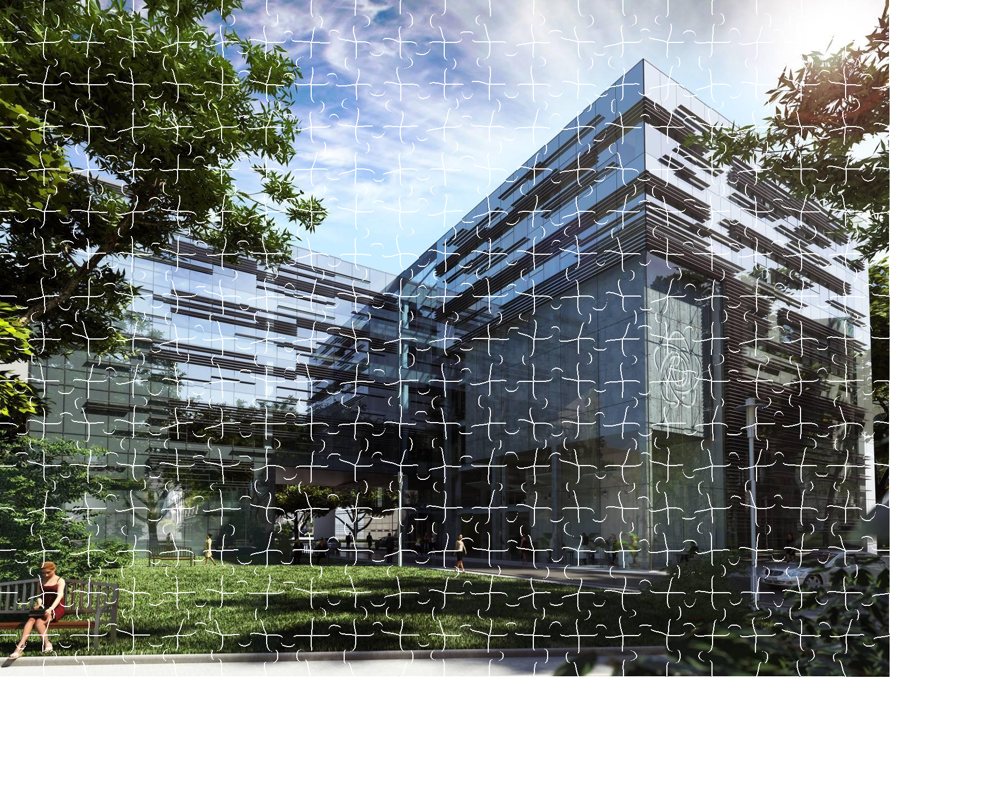

In [148]:
#300 kawałków
matrix=matrix_of_translation(result,whole_df2,"raster_obrot")
visualization(result, matrix, whole_df2,"raster_obrot")

## Układanie bez obrotów

Kod dla poprzedniej implementacji rozwiązania - bez obrotów. 

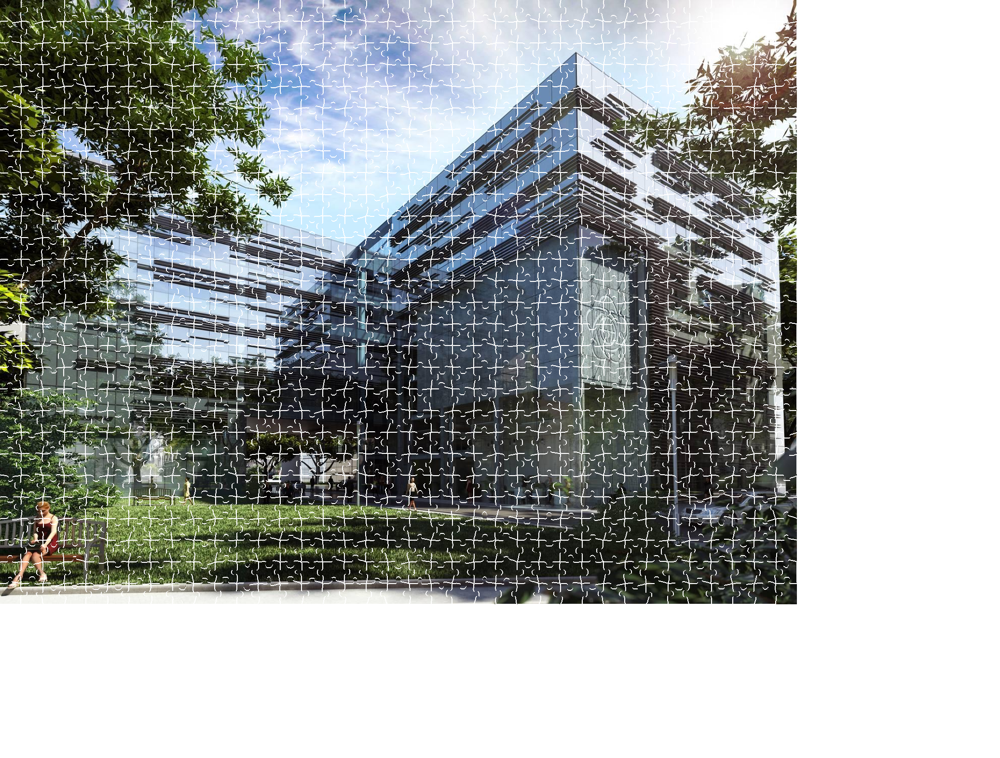

In [109]:
#MINI na 1000 kawałków
# ok. 3 minut
matrix=matrix_of_translation(result,whole_df2,"raster10")
visualization(result, matrix, whole_df2,"raster10")

__________________________________________________________________

___________________________________________________________________

# Praca inżynierska - sieć neuronowa

## Ogólny opis sieci
W tej części pracy skupimy się na zastosowaniu sieci neuronowej do układania puzzli. Do treningu sieci wykorzystamy wszystkie metryki wyznaczone w pierwszej części pracy. Dzięki sieci neuronowej zdecydowanie uprości się algorytm układania puzzli. Sieć neuronowa będzie miała za zadanie prognozę, czy dwa kawałki puzzli pasują do siebie - klasyfikacja binarna.

In [51]:
import keras_tuner as kt
from tensorflow.keras import layers
from kerastuner.tuners import RandomSearch
from sklearn.model_selection import train_test_split
from keras.models import Sequential, Model
from keras.layers import Input, Dense, Concatenate, Flatten
import keras
import tensorflow as tf
import ast
from keras.optimizers import Adam
from PIL import ImageFont
from PIL import ImageDraw

C:\Users\piotr\AppData\Local\Temp\ipykernel_17872\444917402.py:3: DeprecationWarning: `import kerastuner` is deprecated, please use `import keras_tuner`.
  from kerastuner.tuners import RandomSearch


## Przygotowanie danych do sieci
Do treningu wykorzystamy 20 obrazków. Obrazki zostały podzielone na stosunkowo małą liczbę puzzli (od 25 do 110) ze względów prakktycznych - wykorzystanie sieci neuronowej zajmuje więcej czasu niż metoda manualna. W celu zbalansowania zbioru treningowego wybieramy z każdego obrazka wszystkie pary pasujących do siebie (`1`) oraz tyle samo par puzzli nie pasujących do siebie (`0`). 

Istotne jest, że do prawidłowej klasyfikacji potrzebujemy dwie sieci neuronowe. Jedna stwierdza, czy puzzle pasują do siebie poziomo - nowy puzzel dokładamy z prawej strony. Druga sieć dotyczy klasyfikacji pionowej - nowy puzzel dokładamy z dołu. 

## Proces układania przez sieć neuronową
* Proces rozpoczynamy zawsze od lewego górnego narożnika - z metryk wiemy, który to puzzel.
* Ułożenie górnej ramki - korzystamy tylko z sieci poziomej.
* Ułożenie ramki z lewej strony - korzystamy tylko z sieci pionowej.
* Ułożenie pozostałych puzzli - korzystamy z obu sieci. Wybieramy puzzel, który uzyska największą sumę dopasowania do puzzla z lewej i góry.

### Funkcje do stworzenia treningowego zbioru
W sieci neuronowej możemy wykorzystywać wektory, ale jednowymiarowe oraz o identycznych długościach dla danej kolumny. Poniższe funkcje mają na celu przygotowanie ramki danych do treningu sieci neuronowej.

Nazewnictwo - funkcje z końcówką `left` odpowiadają za sieć poziomą a z końcówką `top` za pionową.

In [53]:
#Funkcja odpowiada za pozbycie się tupli
def prepare_color_columns(df):
    color_columns=['1_c','2_c','3_c','4_c']

    for column in color_columns:
        df=df.explode(column)

    return df

In [ ]:
#Funkcja zwraca wysokość i szerokość puzzla o danym id
def width_height(id_left,directory):
    file=re.sub(r'\d+$', '', id_left)

    file_path=directory + "\\" + file
    image=getPixels(file_path)
    height=len(image)
    width=len(image[0])
    
    return [height,width]

In [568]:
#Wybieramy pary puzzli pasujących do siebie
#df_left_nn to końcowa ramka do teningu
#result to prawidłowe rozwiązanie znane z metody manualnej
def prepare_df_left(df_left_nn,result,df,directory):
    counter=len(df_left_nn)
    for i in range (result.shape[0]):
        for j in range (result.shape[1]-1):

            id_left=result.iloc[i][j]
            id_right=result.iloc[i][j+1]

            width_height_l=width_height(id_left,directory)
            width_height_r=width_height(id_right,directory)

            value_left=df[df['id']==id_left]
            value_right=df[df['id']==id_right]

            record=list(value_left.iloc[0])+width_height_l+list(value_right.iloc[0])+width_height_r+[1]  #Dodajemy rekordy składające się z metryk dla pasujących puzzli 
            df_left_nn.loc[counter,:]=record
            counter+=1

    return df_left_nn

In [ ]:
#Wybieramy pary puzzli niepasujących do siebie
def prepare_df_left_bad(df_left_nn,result,df,directory):
    counter=len(df_left_nn)

    for i in range (result.shape[0]):
        for j in range (result.shape[1]-1):
            id_left=result.iloc[i][j]
            if(j==result.shape[1]-2):
                 id_right=result.iloc[i][j-3]
            else:
                id_right=result.iloc[i][j+2]    #Wybieram dwa puzzle z tego samego wiersza, ale oddalone o dwa elemnty od siebie (niepasujące)

            width_height_l=width_height(id_left,directory)
            width_height_r=width_height(id_right,directory)
            
            value_left=df[df['id']==id_left]
            value_right=df[df['id']==id_right]

            record1=list(value_left.iloc[0])+width_height_l+list(value_right.iloc[0])+width_height_r+[0]    #Dla różnorodności zbioru zamieniam kolejność puzzli
            record2=list(value_right.iloc[0])+width_height_r+list(value_left.iloc[0])+width_height_l+[0]    #Co powoduje, że dla jednej pary dodaje dwa rekordy
            df_left_nn.loc[counter,:]=record1
            df_left_nn.loc[counter+1,:]=record2
            counter+=2

    return df_left_nn

In [567]:
def prepare_df_top(df_top_nn,result,df,directory):
    counter=len(df_top_nn)
    for i in range (result.shape[1]):
        for j in range (result.shape[0]-1):

            id_left=result.iloc[j][i]
            id_right=result.iloc[j+1][i]

            width_height_l=width_height(id_left,directory)
            width_height_r=width_height(id_right,directory)

            value_left=df[df['id']==id_left]
            value_right=df[df['id']==id_right]

            record=list(value_left.iloc[0])+width_height_l+list(value_right.iloc[0])+width_height_r+[1]
            df_top_nn.loc[counter,:]=record
            counter+=1

    return df_top_nn

In [566]:
def prepare_df_top_bad(df_top_nn,result,df,directory):
    counter=len(df_top_nn)
    for i in range (result.shape[1]):
        for j in range (result.shape[0]-1):
            id_left=result.iloc[j][i]

            if(j==result.shape[0]-2):
                 id_right=result.iloc[j-3][i]   
            else:
                id_right=result.iloc[j+2][i]
                
            width_height_l=width_height(id_left,directory)
            width_height_r=width_height(id_right,directory)

            value_left=df[df['id']==id_left]
            value_right=df[df['id']==id_right]

            record1=list(value_left.iloc[0])+width_height_l+list(value_right.iloc[0])+width_height_r+[0]
            record2=list(value_right.iloc[0])+width_height_r+list(value_left.iloc[0])+width_height_l+[0]
            df_top_nn.loc[counter,:]=record1
            df_top_nn.loc[counter+1,:]=record2
            counter+=2

    return df_top_nn

In [ ]:
#Wykorzystujemy metodę manualną do znalezienia rozwiązań 20 różnych obrazków
results=[]
for i in range(1,21):
    result=pd.DataFrame(demonstrator_without_rotations(f'generator_obrazkow//test_{i}//size-100//raster'))
    results.append(result)

In [599]:
#Tworzymy ramkę danych do sieci
#Wykorzystujemy rozwiązania z metody manualnej
all_columns_left=['id_left','3_x_left','4_x_left','3_y_left','4_y_left','3_c_left','4_c_left','3_d_left','4_d_left','type_left','height_left','width_left',
 'id_right','3_x_right','4_x_right','3_y_right','4_y_right','3_c_right','4_c_right','3_d_right','4_d_right','type_right','height_right','width_right',
 'class'
]
df_left_nn = pd.DataFrame(columns=all_columns_left)
for i in range(20):
    result=results[i]

    type_boolean=create_matrix_of_bindings_type(f'generator_obrazkow//test_{i+1}//size-100//raster')
    type_string,types_of_elements=final_matrix_of_bindings_kind(type_boolean,f'generator_obrazkow//test_{i+1}//size-100//raster')
    metrics2=metrics_of_bindings(type_string,f'generator_obrazkow//test_{i+1}//size-100//raster',10)
    
    whole_df2=transform_arrays_to_df(type_string,metrics2,types_of_elements)
    whole_df2=colors_of_pixels(f'generator_obrazkow//test_{i+1}//size-100//raster',whole_df2)
    whole_df2=create_whole_df_with_rotations(whole_df2)
    whole_df2=prepare_color_columns(whole_df2)

    data_neural_network_left=whole_df2[['id','3_x','4_x','3_y','4_y','3_c','4_c','3_d','4_d','type']]      #Tylko te kolumny przydadzą się w sieci
    
    df_left_nn=prepare_df_left(df_left_nn,result,data_neural_network_left,f'generator_obrazkow//test_{i+1}//size-100//raster')  #Pasujące rekordy
    print(len(df_left_nn))
    df_left_nn=prepare_df_left_bad(df_left_nn,result,data_neural_network_left,f'generator_obrazkow//test_{i+1}//size-100//raster')  #Niepasujące rekordy
    print(len(df_left_nn))

108
324
432
648
756
972
1068
1260
1350
1530
1618
1794
1871
2025
2105
2265
2337
2481
2551
2691
2754
2880
2943
3069
3123
3231
3287
3399
3441
3525
3565
3645
3673
3729
3759
3819
3843
3891
3911
3951


In [607]:
all_columns_top=['id_top','1_x_top','2_x_top','1_y_top','2_y_top','1_c_top','2_c_top','1_d_top','2_d_top','type_top','height_top','width_top',
 'id_bottom','1_x_bottom','2_x_bottom','1_y_bottom','2_y_bottom','1_c_bottom','2_c_bottom','1_d_bottom','2_d_bottom','type_bottom','height_bottom','width_bottom',
 'class'
]
df_top_nn = pd.DataFrame(columns=all_columns_top)
for i in range(20):
    result=results[i]

    type_boolean=create_matrix_of_bindings_type(f'generator_obrazkow//test_{i+1}//size-100//raster')
    type_string,types_of_elements=final_matrix_of_bindings_kind(type_boolean,f'generator_obrazkow//test_{i+1}//size-100//raster')
    metrics2=metrics_of_bindings(type_string,f'generator_obrazkow//test_{i+1}//size-100//raster',10)
    
    whole_df2=transform_arrays_to_df(type_string,metrics2,types_of_elements)
    whole_df2=colors_of_pixels(f'generator_obrazkow//test_{i+1}//size-100//raster',whole_df2)
    whole_df2=create_whole_df_with_rotations(whole_df2)
    whole_df2=prepare_color_columns(whole_df2)

    data_neural_network_top=whole_df2[['id','1_x','2_x','1_y','2_y','1_c','2_c','1_d','2_d','type']]
    
    df_top_nn=prepare_df_top(df_top_nn,result,data_neural_network_top,f'generator_obrazkow//test_{i+1}//size-100//raster')
    print(len(df_top_nn))
    df_top_nn=prepare_df_top_bad(df_top_nn,result,data_neural_network_top,f'generator_obrazkow//test_{i+1}//size-100//raster')
    print(len(df_top_nn))

104
312
416
624
728
936
1035
1233
1321
1497
1581
1749
1829
1989
2066
2220
2290
2430
2496
2628
2688
2808
2868
2988
3038
3138
3192
3300
3340
3420
3456
3528
3558
3618
3646
3702
3723
3765
3785
3825


## Przetwarzanie danych do ostatecznej ramki

W tej części dokonujemy obróbki danych z metody manualnej. Pozbywamy się braków danych, dokonujemy kodowania, wyrównujemy długość wektorów.

In [54]:
def replace_none_with_empty_list(x):
    if x is None:
        return []
    else:
        return x

In [55]:
#Funkcja wykonuje: kodowanie (jeszcze nieostateczne), braki danych zamienia na puste listy i restuje indexy w ramce danych
def first_pipeline(df_left_nn2):
    
    df_left_nn2=df_left_nn2.replace({'ramka':0,'wklesle':1,'wypukle':2,'corner':0,'frame':1,'non_frame':2})
    df_left_nn2=df_left_nn2.applymap(replace_none_with_empty_list)
    df_left_nn2 =df_left_nn2 .reset_index(drop=True)

    return df_left_nn2

In [601]:
df_left_nn =first_pipeline(df_left_nn)
df_top_nn =first_pipeline(df_top_nn)

In [590]:
df_left_nn.to_csv('df_left_nn.csv', index=False)
df_top_nn.to_csv('df_top_nn.csv', index=False)

In [587]:
df_left_nn_left=pd.read_csv('df_left_nn.csv')
df_top_nn_top=pd.read_csv('df_top_nn.csv')

In [603]:
df_left_nn=df_left_nn[['id_left','4_x_left','4_y_left','4_c_left','type_left','height_left',
       'width_left','id_right', '3_x_right','3_y_right','3_c_right','type_right', 'height_right', 'width_right', 'class']]

In [609]:
df_top_nn=df_top_nn[['id_top','2_x_top','2_y_top','2_c_top','type_top', 'height_top', 'width_top',
                       'id_bottom', '1_x_bottom','1_y_bottom', '1_c_bottom','type_bottom',
                        'height_bottom', 'width_bottom', 'class']]

In [58]:
#Funkcja do wyrównania długości wektorów oraz pozbycia się 4 wartości tupla z kolorem pixeli (ostatnia wartość w RGBA zawsze równa 255)
def pipeline_columns_with_lists(df_left_nn,columns,columns2):
    
    all_columns=columns+columns2

    max_length=[0,0,0,0]
    iter=0

    for column in columns:
        for i in range(len(df_left_nn)):
            if len(df_left_nn.at[i, column])>max_length[iter]:
                max_length[iter]=len(df_left_nn.at[i, column])

        iter+=1

    for column in columns2:
        for i in range(len(df_left_nn)):
            a=df_left_nn.at[i,column]
            df_left_nn.at[i, column]=[i for sub in a for i in sub]

            if len(df_left_nn.at[i, column])>max_length[iter]:
                max_length[iter]=len(df_left_nn.at[i, column])

        iter+=1

    iter=0
    for column in all_columns:
        for i in range(len(df_left_nn)):
        
            x=np.pad(df_left_nn.at[i, column], (0, max_length[iter]-len(df_left_nn.at[i, column])), 'constant')
            df_left_nn.at[i, column]=list(x)
        iter+=1

    for column in columns2:
        for i in range(len(df_left_nn)):
            del df_left_nn.at[i, column][3::4]

    return df_left_nn,max_length

In [610]:
df_left_nn,max_left=pipeline_columns_with_lists(df_left_nn,['4_y_left','3_y_right'],['4_c_left','3_c_right'])
df_top_nn,max_top=pipeline_columns_with_lists(df_top_nn,['2_y_top','1_y_bottom'],['2_c_top','1_c_bottom'])

In [611]:
df_top_nn=pd.get_dummies(df_top_nn, prefix=['2_x_top', 'type_top','1_x_bottom','type_bottom'], columns=['2_x_top', 'type_top','1_x_bottom','type_bottom'], dtype=float)
df_left_nn=pd.get_dummies(df_left_nn, prefix=['4_x_left', 'type_left','3_x_right','type_right'], columns=['4_x_left', 'type_left',	'3_x_right','type_right'], dtype=float)

In [612]:
df_top_nn=df_top_nn[['id_top', '2_y_top', '2_c_top', 'height_top', 'width_top', 'id_bottom',
       '1_y_bottom', '1_c_bottom', 'height_bottom', 'width_bottom',
       '2_x_top_0', '2_x_top_1', '2_x_top_2', 'type_top_0', 'type_top_1',
       'type_top_2', '1_x_bottom_0', '1_x_bottom_1', '1_x_bottom_2',
       'type_bottom_0', 'type_bottom_1', 'type_bottom_2', 'class']]

df_left_nn=df_left_nn[['id_left', '4_y_left', '4_c_left', 'height_left', 'width_left',
       'id_right', '3_y_right', '3_c_right', 'height_right', 'width_right', '4_x_left_0', '4_x_left_1', '4_x_left_2', 'type_left_0',
       'type_left_1', 'type_left_2', '3_x_right_0', '3_x_right_1',
       '3_x_right_2', 'type_right_0', 'type_right_1', 'type_right_2',
       'class']]


## Tworzenie modelu

Po obróbce danych możemy rozpocząć trening sieci neuronowej. W tym celu potrzebujemy znalezienia najlepszej architektury. Eksperymentalnie zostały znalezione 3 najlepsze architektury:
* jedna warstwa 50 neuronów
* dwie warstwy po 20 neuronów
* trzy warstwy odpowiednio 25, 15 i 10 neuronów

Ostatecznie na zbiorze testowym najlepsze wyniki uzyskała architektura z jedną warstwą ukrytą i to ona została wykorzystana w ostatecznym modelu. 

W ramce danych do treningu wyróżniamy kolumny z wartościami liczbowymi i wektorowymi. Kolumny wektorowe są dodawane do modelu osobno. Jest to spowodowane wymaganiami biblioteki `keras` i wykorzystanej `Keras - API`.

In [613]:
test_without_lists_top=df_top_nn[[ 'height_top', 'width_top',
        'height_bottom', 'width_bottom',
       '2_x_top_0', '2_x_top_1', '2_x_top_2', 'type_top_0', 'type_top_1',
       'type_top_2', '1_x_bottom_0', '1_x_bottom_1', '1_x_bottom_2',
       'type_bottom_0', 'type_bottom_1', 'type_bottom_2', 'class']]


test_without_lists_left=df_left_nn[[  'height_left', 'width_left',  'height_right', 'width_right',
       '4_x_left_0', '4_x_left_1', '4_x_left_2', 'type_left_0', 'type_left_1',
       'type_left_2', '3_x_right_0', '3_x_right_1', '3_x_right_2',
       'type_right_0', 'type_right_1', 'type_right_2', 'class']]

In [615]:
#Podział na zbiór treningowy i testowy
def split_set(df_left_nn,test_without_lists_left,columns):

    labels_left=df_left_nn['class']
    features = test_without_lists_left.iloc[:,:-1]

    X=features
    y=np.ravel(labels_left)
    X_train_left, X_test_left, y_train_left, y_test_left = train_test_split(X, y, test_size=0.3, random_state=42) 

    index_X_train_left=list(X_train_left.index.values)
    index_X_test_left=list(X_test_left.index.values)

    arr_of_results_train=[]
    arr_of_results_test=[]

    for column in columns:  #Zapis kolumn  wektorowych do tablic z numpy
        result=[]
        for i in range(len(df_left_nn)):
            result.append(df_left_nn.at[i, column])
        result=np.array(result)
        arr_of_results_train.append(result[index_X_train_left])
        arr_of_results_test.append(result[index_X_test_left])

    return X_train_left, X_test_left, y_train_left, y_test_left, arr_of_results_train, arr_of_results_test

In [616]:
X_train_left, X_test_left, y_train_left, y_test_left, arr_of_results_left_train, arr_of_results_left_test = split_set(df_left_nn,test_without_lists_left,['4_y_left','3_y_right','4_c_left','3_c_right'])
X_train_top, X_test_top, y_train_top, y_test_top, arr_of_results_top_train, arr_of_results_top_test = split_set(df_top_nn,test_without_lists_top,['2_y_top','1_y_bottom','2_c_top','1_c_bottom'])

In [618]:
#Tworzymy model, dodając do niego ramkę z kolumnami liczbowymi oraz osobno kolumny wektorowe
def create_model(X_train_left, X_test_left, y_train_left, y_test_left, arr_of_results_train, arr_of_results_test,neuron):
    grid_input = Input(shape=(arr_of_results_train[0].shape[1],), name='grid_input')  
    flattened_grid = Flatten()(grid_input)

    grid_input2 = Input(shape=(arr_of_results_train[1].shape[1],), name='grid_input2')  
    flattened_grid2 = Flatten()(grid_input2)

    grid_input3 = Input(shape=(arr_of_results_train[2].shape[1],), name='grid_input3') 
    flattened_grid3 = Flatten()(grid_input3)

    grid_input4 = Input(shape=(arr_of_results_train[3].shape[1],), name='grid_input4')  
    flattened_grid4 = Flatten()(grid_input4)

    df_input = Input(shape=(X_train_left.shape[1],), name='df_input')   #Dane z ramki danych bez kolumn z wektorami
    concatenated = Concatenate()([flattened_grid,flattened_grid2,flattened_grid3,flattened_grid4, df_input])

    
    dense_layer = Dense(neuron, activation='relu')(concatenated)

    output_layer = Dense(1, activation='sigmoid', name='output')(dense_layer)


    model = Model(inputs=[grid_input,grid_input2,grid_input3,grid_input4, df_input], outputs=output_layer)

    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])


    model.fit({'grid_input': arr_of_results_train[0],'grid_input2': arr_of_results_train[1],'grid_input3': arr_of_results_train[2],'grid_input4': arr_of_results_train[3], 'df_input': X_train_left}, y_train_left, epochs=10, batch_size=8)
    model.evaluate({'grid_input': arr_of_results_test[0],'grid_input2': arr_of_results_test[1],'grid_input3': arr_of_results_test[2],'grid_input4': arr_of_results_test[3], 'df_input': X_test_left}, np.asarray(y_test_left).astype(np.float32),verbose=1)

    return model

In [619]:
model_left2=create_model(X_train_left, X_test_left, y_train_left, y_test_left, arr_of_results_left_train, arr_of_results_left_test,50)
print('----------------------------------------------------')
model_top2=create_model(X_train_top, X_test_top, y_train_top, y_test_top, arr_of_results_top_train, arr_of_results_top_test,50)

Epoch 1/10
346/346 [==============================] - 3s 2ms/step - loss: 4.7234 - accuracy: 0.6767
Epoch 2/10
346/346 [==============================] - 1s 2ms/step - loss: 1.9356 - accuracy: 0.8051
Epoch 3/10
346/346 [==============================] - 1s 2ms/step - loss: 1.1353 - accuracy: 0.8481
Epoch 4/10
346/346 [==============================] - 1s 2ms/step - loss: 0.9010 - accuracy: 0.8626
Epoch 5/10
346/346 [==============================] - 1s 2ms/step - loss: 0.6196 - accuracy: 0.8984
Epoch 6/10
346/346 [==============================] - 1s 2ms/step - loss: 0.7129 - accuracy: 0.8995
Epoch 7/10
346/346 [==============================] - 1s 2ms/step - loss: 0.5107 - accuracy: 0.9092
Epoch 8/10
346/346 [==============================] - 1s 2ms/step - loss: 0.5895 - accuracy: 0.9078
Epoch 9/10
346/346 [==============================] - 1s 2ms/step - loss: 0.7523 - accuracy: 0.8998
Epoch 10/10
38/38 [==============================] - 0s 2ms/step - loss: 0.5864 - accuracy: 0.9030
-

In [701]:
model_left2.save('model_left_2.keras')
model_top2.save('model_top_2.keras')

Dla obu sieci otrzymaliśmy dokładność na poziomie około `0.9`. Jest to wysoki wynik, lecz należy pamiętać, że to dokładność dla klasyfikacji dwóch konkretnych puzzli. Przy symulacji układania puzzli musimy zawsze wykonać `N` porównań, gdzie `N` to liczba pozostałych puzzli.

### Wczytanie danych
W celach praktycznych oba modele zostały zapisane do plików. Dzięki temu nie trzeba za każdym razem uruchamiać powyższego kodu. Wystarczy załadować poniższe modele.

In [56]:
model_left2 = keras.models.load_model('model_left_2.keras')
model_top2 = keras.models.load_model('model_top_2.keras')

## Walidacja sieci
Do zwalidowania modeli wykorzystujemy inny obrazek niż te ze zbioru treningowego. Poniższe funkcje służą przygtowaniu testów dokładności i przeprowadzeniu symulacji ukłądania puzzli przez sieć neuronową.

In [219]:
#Funkcja do stworzenia ramki danych dla puzzli ze zbioru walidacyjnego; brak znanej klasy
def create_df_with_next_possible_vectors(whole_df2,id_left,directory):
    counter=0
    data_neural_network_left=whole_df2[['id','4_x','4_y','4_c','4_d','type']]
    data_neural_network_right=whole_df2[['id','3_x','3_y','3_c','3_d','type']]

    all_columns_left=['id_left','4_x_left','4_y_left','4_c_left','4_d_left','type_left','height_left','width_left',
        'id_right','3_x_right','3_y_right','3_c_right','3_d_right','type_right','height_right','width_right']
    df_left_nn2 = pd.DataFrame(columns=all_columns_left)

    value_left=data_neural_network_left[data_neural_network_left['id']==id_left]
    width_height_l=width_height(id_left,directory)

    for j in range(len(data_neural_network_right)):
        id_right=data_neural_network_right.iloc[j]['id']
        if(id_right==id_left):
            continue
        width_height_r=width_height(id_right,directory)

        record=list(value_left.iloc[0])+width_height_l+list(data_neural_network_right.iloc[j])+width_height_r
        df_left_nn2.loc[counter,:]=record
        counter+=1

    return df_left_nn2

In [58]:
def create_df_with_next_possible_vectors_top(whole_df2,id_left,directory):
    counter=0
    data_neural_network_left=whole_df2[['id','2_x','2_y','2_c','2_d','type']]
    data_neural_network_right=whole_df2[['id','1_x','1_y','1_c','1_d','type']]

    all_columns_top=['id_top','2_x_top','2_y_top','2_c_top','2_d_top','type_top','height_top','width_top',
            'id_bottom','1_x_bottom','1_y_bottom','1_c_bottom','1_d_bottom','type_bottom','height_bottom','width_bottom']
    df_left_nn2 = pd.DataFrame(columns=all_columns_top)

    value_left=data_neural_network_left[data_neural_network_left['id']==id_left]
    width_height_l=width_height(id_left,directory)

    for j in range(len(data_neural_network_right)):
        id_right=data_neural_network_right.iloc[j]['id']
        if(id_right==id_left):
            continue
        width_height_r=width_height(id_right,directory)

        record=list(value_left.iloc[0])+width_height_l+list(data_neural_network_right.iloc[j])+width_height_r
        df_left_nn2.loc[counter,:]=record
        counter+=1


    return df_left_nn2

In [59]:
#Przygotowanie danych - te same funkcje co dla zbioru treningowego
def simulation_rate(whole_df2,id,directory,final_matrix):
    zz=create_df_with_next_possible_vectors(whole_df2,id,directory)
    zzz=first_pipeline(zz)
     

    columns2=['4_c_left', '3_c_right']
    for column in columns2:
        for i in range(len(zzz)):
            a=zzz.at[i,column]
            zzz.at[i, column]=[j for sub in a for j in sub]
            del zzz.at[i, column][3::4]

    columns=['4_y_left','3_y_right','4_c_left','3_c_right']

    iter=0
    for column in columns:
        for i in range(len(zzz)):
                       
            if(len((zzz.at[i, column]))>max_left[iter]):
                zzz.at[i, column]=zzz.at[i, column][:max_left[iter]]
            x=np.pad(zzz.at[i, column], (0, max_left[iter]-len(zzz.at[i, column])), 'constant')

            
            zzz.at[i, column]=list(x)
        iter+=1

    v=list(zzz.iloc[:]['id_right'])
    indices=if_final_matrix_element2(v,final_matrix)
    zzz=zzz[zzz['id_right'].isin(indices)]
    zzz=zzz[zzz['4_x_left']!=zzz['3_x_right']]
    
    return zzz


In [60]:
def simulation_rate_top(whole_df2,id,directory,final_matrix):
    zz=create_df_with_next_possible_vectors_top(whole_df2,id,directory)
    zzz=first_pipeline(zz)
        

    columns2=['2_c_top','1_c_bottom']
    
    for column in columns2:
        for i in range(len(zzz)):
            a=zzz.at[i,column]
            zzz.at[i, column]=[j for sub in a for j in sub]
            del zzz.at[i, column][3::4]

    columns=['2_y_top','1_y_bottom','2_c_top','1_c_bottom']

    iter=0
    for column in columns:
        for i in range(len(zzz)):
            if(len((zzz.at[i, column]))>max_top[iter]):
                zzz.at[i, column]=zzz.at[i, column][:max_top[iter]]
            x=np.pad(zzz.at[i, column], (0, max_top[iter]-len(zzz.at[i, column])), 'constant')

            zzz.at[i, column]=list(x)
        iter+=1

    v=list(zzz.iloc[:]['id_bottom'])
    indices2=if_final_matrix_element2(v,final_matrix)
    zzz=zzz[zzz['id_bottom'].isin(indices2)]
    zzz=zzz[zzz['2_x_top']!=zzz['1_x_bottom']]
    
    return zzz

## Symulacja
Po wstępnych symulacjach okazało się, że sieć nie jest w stanie ułożyć bezbłędnie ramki nawet dla małych obrazków. Z tego powodu należało zmienić pomysł na wykorzystanie tej metody. Nowy pomysł był następujący:
* ograniczamy zbiór kolejnych puzzli do tych z pasującymi wypustkami
* dla każdego elementu ze zbioru obliczamy wrtość dopasowania - metoda `predict`
* Wyświetlamy dostępne puzzle od tych z najwyższym dopasowaniem
* Użytkownik wybiera ten, który rzeczywiście pasuje

Oznacza to, że sieć neuronowa nie ułoży sama obrazka, lecz będzie sugerować użytkownikowi najlepsze propozycje kolejnego kawałka.

In [75]:
#Długości wektorów dla obu sieci neuronowych
max_left=[142,149,108,108]
max_top=[178,178,105,105]

In [62]:
#Wymiary końcowego obrazka
def create_final_matrix_nn(whole_df2):
    columns=len(whole_df2[(whole_df2['1_x']=='ramka')&(whole_df2['rotation']==0)])
    rows=len(whole_df2[(whole_df2['4_x']=='ramka')&(whole_df2['rotation']==0)])

    return columns,rows

In [63]:
#Wybieramy puzzle, których kształt wypustek zgadza się dla zarówno puzzla z góry jak i prawej strony
def create_intersection(zzz,zzz2):
    final_left=pd.DataFrame(columns=zzz.columns)
    final_top=pd.DataFrame(columns=zzz2.columns)

    vector=list(zzz2['id_bottom'])
    counter=0

    for i in range(len(zzz)):
        if(zzz.iloc[i]['id_right'] in vector):
            final_left.loc[counter,:]=list(zzz.iloc[i])
            final_top.loc[counter,:]=list(zzz2[zzz2['id_bottom']==zzz.iloc[i]['id_right']].iloc[0])
            counter+=1
    return final_left, final_top

In [64]:
#Kodowanie zmiennych kategorycznych
def pipeline_for_final_frame_top(final_top):
    
    columns=['2_y_top','1_y_bottom','2_c_top','1_c_bottom']
    arr_of_results2=[]
    
    for column in columns:
        result=[]
        for i in range(len(final_top)):
            result.append(list(final_top.iloc[i][column]))

        result=np.array(result)
        arr_of_results2.append(result)

    final_top=pd.get_dummies(final_top, prefix=['2_x_top', 'type_top','1_x_bottom','type_bottom'], columns=['2_x_top', 'type_top','1_x_bottom','type_bottom'], dtype=float)

    columnss=['2_x_top_0','2_x_top_1','2_x_top_2','1_x_bottom_0','1_x_bottom_1','1_x_bottom_2', 'type_top_0', 'type_top_1', 'type_top_2', 'type_bottom_0', 'type_bottom_1', 'type_bottom_2']
    for column in columnss:
        if column not in final_top.columns:
            final_top[column]=0.0

    final_top_without_lists=final_top[['height_top', 'width_top', 'height_bottom', 'width_bottom',
        '2_x_top_0', '2_x_top_1', '2_x_top_2', 'type_top_0', 'type_top_1',
        'type_top_2', '1_x_bottom_0', '1_x_bottom_1', '1_x_bottom_2',
        'type_bottom_0', 'type_bottom_1', 'type_bottom_2']]

    return np.asarray(final_top_without_lists).astype('float32'), arr_of_results2,final_top

In [65]:
def pipeline_for_final_frame_left(final_left):
    columns=['4_y_left','3_y_right','4_c_left','3_c_right']
    arr_of_results=[]
        
    for column in columns:
        result=[]
        for i in range(len(final_left)):
            result.append(list(final_left.iloc[i][column]))

        result=np.array(result)
        arr_of_results.append(result)

    final_left=pd.get_dummies(final_left, prefix=['4_x_left', 'type_left','3_x_right','type_right'], columns=['4_x_left', 'type_left','3_x_right','type_right'], dtype=float)

    columnss=['4_x_left_0','4_x_left_1','4_x_left_2','3_x_right_0','3_x_right_1','3_x_right_2', 'type_left_0', 'type_left_1', 'type_left_2', 'type_right_0', 'type_right_1', 'type_right_2']
    for column in columnss:
        if column not in final_left.columns:
            final_left[column]=0.0

    final_left_without_lists=final_left[['height_left', 'width_left', 'height_right', 'width_right',
        '4_x_left_0', '4_x_left_1', '4_x_left_2', 'type_left_0', 'type_left_1',
        'type_left_2', '3_x_right_0', '3_x_right_1', '3_x_right_2',
        'type_right_0', 'type_right_1', 'type_right_2']]

    return np.asarray(final_left_without_lists).astype('float32'), arr_of_results,final_left

In [66]:
#Wywołanie metody predict, zwracającej poziom dopasowania
def prediction(model,final_without_lists,arr_of_results):
    t=model.predict({'grid_input': arr_of_results[0],'grid_input2': arr_of_results[1],
                'grid_input3': arr_of_results[2],'grid_input4': arr_of_results[3], 'df_input': final_without_lists})

    return t

In [67]:
def all_changes_left(whole_df,directory,final_matrix,id_left,final_left):
    
    final_left_without_lists,arr_of_results,final_left=pipeline_for_final_frame_left(final_left)
    t_left=prediction(model_left2,final_left_without_lists,arr_of_results)

    return t_left,final_left

In [68]:
def all_changes_top(whole_df,directory,final_matrix,id_top,final_top):
    
    final_top_without_lists,arr_of_results,final_top=pipeline_for_final_frame_top(final_top)
    t_top=prediction(model_top2,final_top_without_lists,arr_of_results)

    return t_top,final_top

In [69]:
#Funkcja zwraca dostępne puzzle posortowane od najlepszego do najgorszego
def n_best_possible_puzzles(whole_df,directory,final_matrix,id_top,id_left):
    
    final_left=simulation_rate(whole_df2,id_left,directory,final_matrix)
    final_top=simulation_rate_top(whole_df2,id_top,directory,final_matrix)
    final_left,final_top=create_intersection(final_left,final_top)

    t_top,final_top=all_changes_top(whole_df,directory,final_matrix,id_top,final_top)
    t_left,final_left=all_changes_left(whole_df,directory,final_matrix,id_left,final_left)
    t=t_left+t_top

    x=np.argsort(-t,axis=0)
    
    result=[]
    for i in range(len(final_left)):
        result.append(final_left.iloc[x[i][0]]['id_right'])
    
    return result

## Interfejs
Ostatnim elementem pracy inżynierskiej jest stworzenie interfejsu do wykorzystywania metody manualnej oraz inteligentnego układania puzzli. Cały kod znajduje się w folderze `python_project`. Poniżej zostały pokazane przykładowe widoki z interfejsu do inteligentego układania puzzli (interfejs do metody manualnej składa się tylko z wyboru katalogu i wyświetlenie końcowej wizualizacji.)

In [190]:
#Funkcja do stworzenia obrazka z kolejnymi pasującymi kawałkami
#Funkcja odpowiada za wklejenie puzzla lub puzzli, do których należy dopasować kolejny element
def visualization_of_next_puzzles(whole_df2,next_possible_puzzles,directory,id_left,id_top,type_vis='non_frame'):
    if(type_vis=='non_frame'):
        dim=[770,max(200*(len(next_possible_puzzles)+1),500),150,150,150]
    
    else:
        dim=[700,200*(len(next_possible_puzzles)+1),150,150]

    text_img = Image.new('RGBA', (dim[1],dim[0]), (0, 0, 0, 0)) 
    I1 = ImageDraw.Draw(text_img)
    myFont = ImageFont.truetype('arial.ttf', 28)
    if type_vis=='non_frame':
        I1.text((30, 30),"Dołóż puzzel pasujący do obu puzzli", font=myFont )
        filename=directory+'//'+re.sub(r'\d+$', '',id_left)
        image = Image.open(filename, 'r')
        image = image.rotate(whole_df2[whole_df2['id']==id_left].iloc[0]['rotation'], expand=True)
        image = image.resize((150,150))
        text_img.paste(image, (dim[1]*45//100-dim[4],dim[3]+50))
    
        filename=directory+'//'+re.sub(r'\d+$', '',id_top)
        image = Image.open(filename, 'r')
        image = image.rotate(whole_df2[whole_df2['id']==id_top].iloc[0]['rotation'], expand=True)
        image = image.resize((150,150))
        text_img.paste(image, (dim[1]*45//100,70))

    else:
        
        if(id_left==0):
            id=id_top
            I1.text((30, 30),"Dołóż puzzel z dołu", font=myFont )
        else:
            id=id_left
            I1.text((30, 30),"Dołóż puzzel z prawej", font=myFont )
        filename=directory+'//'+re.sub(r'\d+$', '',id)
        image = Image.open(filename, 'r')
        image = image.rotate(whole_df2[whole_df2['id']==id].iloc[0]['rotation'], expand=True)
        image = image.resize((150,150))
        text_img.paste(image, (dim[1]//2-75,100))
  

    return visualization_of_possible_puzzles(text_img,next_possible_puzzles,whole_df2,directory,dim)

In [197]:
#Funkcja odpowiada za wklejenie kolejnych propozycji 
def visualization_of_possible_puzzles(text_img,next_possible_puzzles,whole_df2,directory,dim):
    if(len(dim)==5):
        tmp_height=420
    else:
        tmp_height=350
    tmp_width=50
    for i in range(len(next_possible_puzzles)):

        filename=directory+'//'+re.sub(r'\d+$', '',next_possible_puzzles[i])
        image = Image.open(filename, 'r')
        image = image.rotate(whole_df2[whole_df2['id']==next_possible_puzzles[i]].iloc[0]['rotation'], expand=True)
        image = image.resize((150,150))
        text_img.paste(image, (tmp_width,tmp_height))

        I1 = ImageDraw.Draw(text_img)
        myFont = ImageFont.truetype('arial.ttf', 28)
        I1.text((tmp_width+30, dim[0]-80),next_possible_puzzles[i], font=myFont )

        tmp_width+=200

    return text_img

## Demonstator przykładowych widoków

In [ ]:
#Wykorzystujemy tylko w celach demonstracyjnych
directory='raster'
type_boolean=create_matrix_of_bindings_type(directory)
type_string,types_of_elements=final_matrix_of_bindings_kind(type_boolean,directory)
metrics2=metrics_of_bindings(type_string,directory,10)

whole_df2=transform_arrays_to_df(type_string,metrics2,types_of_elements)
whole_df2=colors_of_pixels(directory,whole_df2)
whole_df2=create_whole_df_with_rotations(whole_df2)
whole_df2=prepare_color_columns(whole_df2)

result=pd.DataFrame(demonstrator_without_rotations(directory))
result

4/4 [==============================] - 0s 0s/step
1053 178


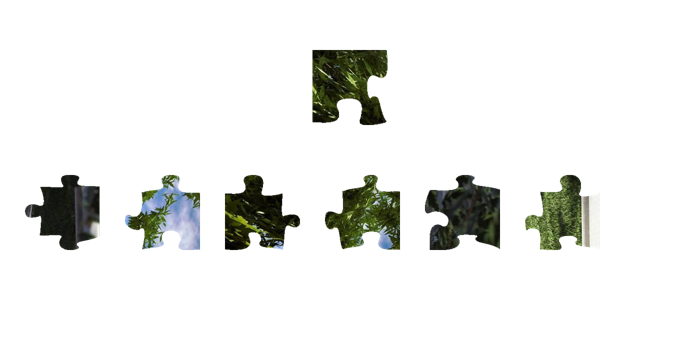

In [214]:
#Dokładanie puzzli pionowe - 6 możliwych puzzli
columns,rows=create_final_matrix_nn(whole_df2)
final_matrix=[[0]*columns for i in range(rows)]

id=whole_df2.iloc[0]['id']
final_matrix[0][0]=id

zz=simulation_rate_top(whole_df2,id,directory,final_matrix)
zz=zz[zz['type_bottom']!=2]
t_left,final_left=all_changes_top(whole_df2,directory,final_matrix,id,zz)

x=np.argsort(-t_left,axis=0)
    
resultt=[]
for i in range(len(final_left)):
    resultt.append(final_left.iloc[x[i][0]]['id_bottom'])

img=visualization_of_next_puzzles(whole_df2,resultt[:6],directory,0,id,'frame_left')
img.resize((img.width//2,img.height//2))

8/8 [==============================] - 0s 2ms/step
975 215


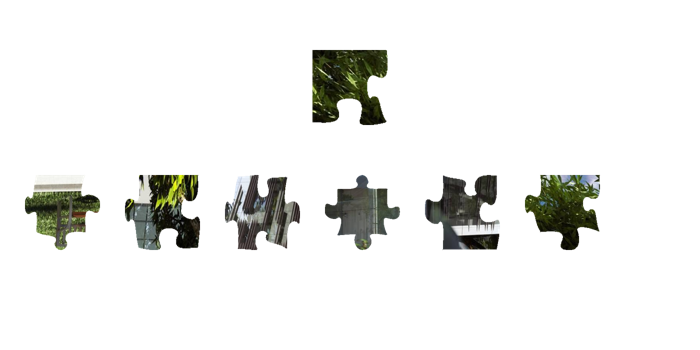

In [217]:
#Dokładanie puzzli poziome - 6 możliwych puzzli
columns,rows=create_final_matrix_nn(whole_df2)
final_matrix=[[0]*columns for i in range(rows)]

id=whole_df2.iloc[0]['id']
final_matrix[0][0]=id

zz=simulation_rate(whole_df2,id,directory,final_matrix)
t_top,final_top=all_changes_left(whole_df2,directory,final_matrix,id,zz)

x=np.argsort(-t_top,axis=0)
    
resultt=[]
for i in range(len(final_top)):
    resultt.append(final_top.iloc[x[i][0]]['id_right'])

img=visualization_of_next_puzzles(whole_df2,resultt[:6],directory,id,0,'frame_top')
img.resize((img.width//2,img.height//2))

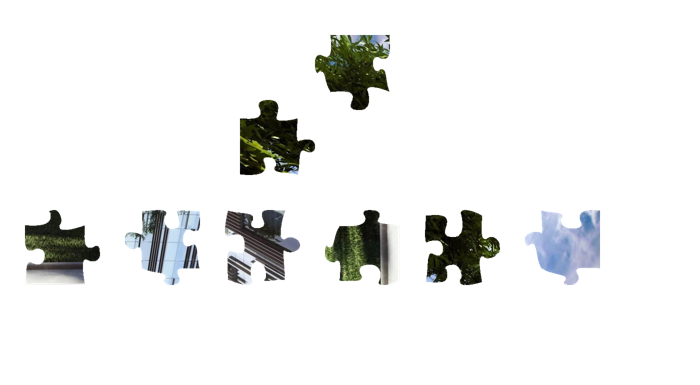

In [218]:
#Układanie puzzli spoza lewej i górnej ramki
id_left='28.png0'
id_top='70.png0'

img=visualization_of_next_puzzles(whole_df2,['0.png0','1.png90','2.png180','3.png270','101.png0','11.png90'],directory,id_left,id_top)
img.resize((img.width//2,img.height//2))
